# setup

In [ ]:
%matplotlib inline
%load_ext autoreload

import dask
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seawater as sw
import xarray as xr
import pop_tools
# %aimport xgcm

# import hvplot.xarray

import dcpy
import pump

mpl.rcParams['savefig.dpi'] = 300
mpl.rcParams['savefig.bbox'] = 'tight'
mpl.rcParams['figure.dpi'] = 140

xr.set_options(keep_attrs=True, display_style="html")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


ModuleNotFoundError: No module named 'pop_tools'

In [ ]:
import distributed
import ncar_jobqueue

if 'client' in locals():
    client.close(); cluster.close()

cluster = ncar_jobqueue.NCARCluster(
    cores=9, processes=4, memory='109GB',
    walltime='02:00:00', project='NCGD0043')

client = dask.distributed.Client(cluster)

cluster.adapt(minimum=4, maximum=24, wait_count=600)
cluster

# xarray tests

# Read data

In [ ]:
def estimate_euc_depth_terms(ds):

    ds.load()

    surface = {'depth': -20, 'method': 'nearest'}

    ds['h'] = (ds.eucmax - surface['depth'])
    ds['h'].attrs['long_name'] = '$h$'

    if 'u' in ds:
        ds['us'] = ds.u.sel(**surface)
        ds['ueuc'] = ds.u.interp(depth=ds.eucmax, longitude=ds.longitude, method='linear')
        ds['du'] = ds.us - ds.ueuc
        ds.du.attrs['long_name'] = '$\Delta$u'

    if 'dens' in ds:
        ds['dens_euc'] = ds.dens.interp(depth=ds.eucmax,
                                        longitude=ds.longitude,
                                        method='linear')
        ds['b'] = ds.dens * -9.81/ds.dens_euc
        ds['bs'] = ds.b.sel(**surface)
        ds['beuc'] = -9.81 * xr.ones_like(ds.bs)

        ds['db'] = ds.bs - ds.beuc
        ds.db.attrs['long_name'] = '$\Delta$b'

    if 'db' in ds and 'du' in ds and 'h' in ds:
        with xr.set_options(keep_attrs=False):
            ds['Ri'] = ds.db * np.abs(ds.h) / (ds.du**2)

    return ds

if 'gcm1' in locals():
    import airsea
    print('skipping gcm1, jra, ssh')
    subset = (gcm1.annual.sel(latitude=0, method='nearest')
              .assign_coords(latitude=0)
              .squeeze()
              .sel(depth=slice(0, -250)))
    subset['dens'] = pump.mdjwf.dens(subset.salt, subset.theta, subset.depth)
    subset['eucmax'] = pump.calc.get_euc_max(subset.u)

    subset = estimate_euc_depth_terms(subset)
    subset.attrs['name'] = 'gcm 1m 1996 mean'

    jra = (pump.obs.read_jra()
           .sel(latitude=0, method='nearest')
           .sel(time='1996')
           .load())
    jra['tau'] = jra.Uwind.copy(
        data=airsea.windstress.stress(np.hypot(jra.Uwind, jra.Vwind)))

    mean_jra = jra.mean('time')
    ssh = xr.open_mfdataset(pump.obs.root + 'make_TPOS_MITgcm/1996/SSH*.nc').zos

johnson = (pump.obs.read_johnson()
           .sel(latitude=0))
johnson['eucmax'] = pump.get_euc_max(johnson.u)
johnson = estimate_euc_depth_terms(johnson)
johnson.attrs['name'] = 'Johnson'

# need to fill to the surface
tao_adcp = pump.obs.read_tao_adcp().mean('time').bfill('depth')
tao_adcp['eucmax'] = pump.get_euc_max(tao_adcp.u)

tao_ctd = (pump.obs.read_tao()
           .sel(latitude=0, longitude=tao_adcp.longitude)
           .drop(['u', 'v'])
           .mean('time')
           .compute())
tao_ctd['eucmax'] = tao_adcp.eucmax
tao_ctd['dens'] = pump.mdjwf.dens(np.array(35.0), tao_ctd.temp, tao_ctd.depth)
tao_ctd_raw = tao_ctd.copy(deep=True)
tao_ctd = (tao_ctd
           .sortby('depth')
           .interpolate_na('depth')
           .sortby('depth', ascending=False)
           .bfill('depth'))

tao = xr.merge([estimate_euc_depth_terms(tao_adcp)[['us', 'ueuc', 'du', 'eucmax']],
                estimate_euc_depth_terms(tao_ctd)[['bs', 'beuc', 'db']]])
tao = estimate_euc_depth_terms(tao)
tao.attrs['name'] = 'TAO'

hires = xr.load_dataset('~/pump/glade/small-eq-mean.nc').sel(longitude=slice(-221, None))
hires['eucmax'] = (pump.calc.get_euc_max(hires.u)
                   .rolling(longitude=200, center=True, min_periods=1)
                   .mean())
hires = estimate_euc_depth_terms(hires)

/glade/u/home/dcherian/pump/pump/obs.py:170: FutureWarning: In xarray version 0.15 the default behaviour of `open_mfdataset`
will change. To retain the existing behavior, pass
combine='nested'. To use future default behavior, pass
combine='by_coords'. See
http://xarray.pydata.org/en/stable/combining.html#combining-multi

  chunks={"lat": 1, "lon": 1, "depth": 5},
/gpfs/u/home/dcherian/python/xarray/xarray/backends/api.py:933: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset`) to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in future, please use the new
`combine_nested` function (or the `combine='nested'` option to
open_mfdataset).The datasets supplied require both concatenation and merging. From
xarray version 0.15 this will operation will require either using the
new `co

## Heat flux

In [ ]:
qnet = (xr.open_dataset('../glade/obs/tao/qnet_xyt_dy.cdf').rename({
    'QT_210': 'qnet',
    'lat': 'latitude',
    'lon': 'longitude'
})['qnet'])
qnet['longitude'] -= 360
qnet = qnet.where(np.abs(qnet) < 1e5)
qnet

<xarray.DataArray 'qnet' (time: 6469, depth: 1, latitude: 11, longitude: 8)>
array([[[[      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         ...,
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
           92.55531]]],


       [[[      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         ...,
         [      nan,       nan,       nan, ...,       nan,     

## SSH

In [ ]:
ssh = (xr.open_mfdataset([pump.obs.root + 'obs/aviso/zos_AVISO_L4_199210-201012.nc'])
      .zos
      .rename({'lat': 'latitude', 'lon': 'longitude'}))
ssh['longitude'] -= 360
ssh = ssh.sel(longitude=slice(-200, -80), latitude=slice(-25, 25)).mean('time').compute()
ssh

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: In xarray version 0.13 the default behaviour of `open_mfdataset`
will change. To retain the existing behavior, pass
combine='nested'. To use future default behavior, pass
combine='by_coords'. See
http://xarray.pydata.org/en/stable/combining.html#combining-multi

  """Entry point for launching an IPython kernel.
/gpfs/u/home/dcherian/python/xarray/xarray/backends/api.py:931: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset`) to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in future, please use the new
`combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  from_openmfds=True,


<xarray.DataArray 'zos' (latitude: 50, longitude: 120)>
array([[1.0146531 , 1.0037938 , 0.99376035, ..., 0.63221073, 0.61761034,
        0.6016931 ],
       [1.0273066 , 1.0175812 , 1.0088582 , ..., 0.62273055, 0.6081634 ,
        0.5922261 ],
       [1.046003  , 1.0380611 , 1.0309224 , ..., 0.61169213, 0.597813  ,
        0.5830368 ],
       ...,
       [1.3097773 , 1.3013064 , 1.2935021 , ..., 0.6009446 , 0.6040544 ,
        0.60238636],
       [1.2980543 , 1.2906426 , 1.2837585 , ..., 0.5306964 , 0.53614575,
        0.5542671 ],
       [1.2794156 , 1.2714981 , 1.263941  , ..., 0.43182534, 0.45010972,
        0.49250126]], dtype=float32)
Coordinates:
  * latitude   (latitude) float64 -24.5 -23.5 -22.5 -21.5 ... 22.5 23.5 24.5
  * longitude  (longitude) float64 -199.5 -198.5 -197.5 ... -82.5 -81.5 -80.5
Attributes:
    standard_name:     sea_surface_height_above_geoid
    long_name:         Sea Surface Height Above Geoid
    units:             m
    original_name:     maps_of_absolute

Text(0.5, 1.0, 'SSH')

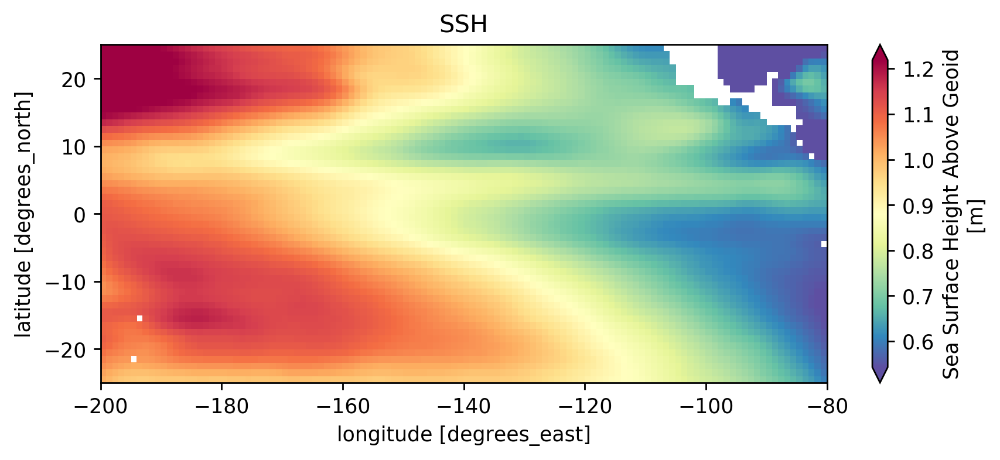

In [ ]:
(ssh).plot(robust=True, cmap=mpl.cm.Spectral_r)
plt.gcf().set_size_inches((8, 3))
plt.gca().set_title('SSH')

Text(0.5, 1.0, '$∂/∂_x$ SSH')

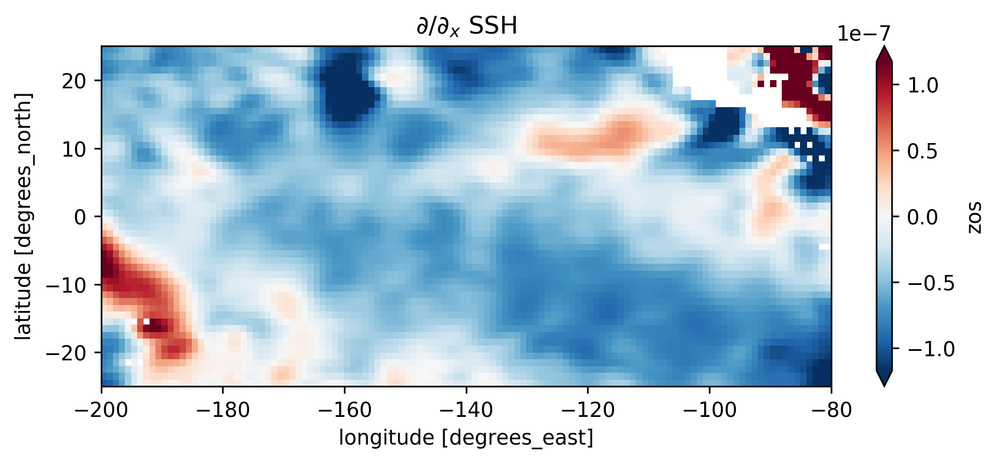

In [ ]:
(ssh.differentiate('longitude')/110e3).plot(robust=True)
plt.gcf().set_size_inches((8, 3))
plt.gca().set_title('$∂/∂_x$ SSH')

## TAO wind

In [ ]:
tau = (xr.open_mfdataset('../glade/obs/tao/tau[x-y]_*_dy.cdf')
      .rename({'TX_442': 'taux',
               'TY_443': 'tauy',
               'lat': 'latitude',
               'lon': 'longitude'}))
tau['longitude'] -= 360
tau = tau.where((tau.taux < 5) & (tau.tauy < 5))

tao = xr.merge([
    tao,
    tau.mean('time').sel(
        latitude=0, longitude=tao.longitude).squeeze().drop('depth').load()[['taux', 'tauy']],
    qnet.sel(latitude=0)
    .reindex(longitude=tao.longitude)
    .squeeze().drop('depth')
    .mean('time')
])
tao['tau'] = np.hypot(tao.taux, tao.tauy)
tao = tao.squeeze()
tao

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: In xarray version 0.13 the default behaviour of `open_mfdataset`
will change. To retain the existing behavior, pass
combine='nested'. To use future default behavior, pass
combine='by_coords'. See
http://xarray.pydata.org/en/stable/combining.html#combining-multi

  """Entry point for launching an IPython kernel.
/gpfs/u/home/dcherian/python/xarray/xarray/backends/api.py:931: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset`) to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in future, please use the new
`combine_nested` function (or the `combine='nested'` option to
open_mfdataset).The datasets supplied require both concatenation and merging. From
xarray version 0.1

<xarray.Dataset>
Dimensions:    (longitude: 6)
Coordinates:
    latitude   float64 0.0
  * longitude  (longitude) float64 -213.0 -204.0 -195.0 -170.0 -140.0 -110.0
Data variables:
    us         (longitude) float32 -0.06934669 0.08536129 ... 0.011650631
    ueuc       (longitude) float64 0.3355 0.4491 0.4932 0.6898 1.049 0.965
    du         (longitude) float64 -0.4049 -0.3638 -0.4965 ... -1.149 -0.9534
    eucmax     (longitude) float32 -225.0 -200.0 -195.0 -155.0 -105.0 -75.0
    bs         (longitude) float64 -9.783 -9.783 -9.785 -9.795 -9.799 -9.8
    beuc       (longitude) float64 -9.81 -9.81 -9.81 -9.81 -9.81 -9.81
    db         (longitude) float64 0.0273 0.02699 0.02499 ... 0.01052 0.009748
    h          (longitude) float32 -205.0 -180.0 -175.0 -135.0 -85.0 -55.0
    Ri         (longitude) float64 34.14 36.72 17.75 2.764 0.6773 0.5898
    taux       (longitude) float32 -0.0027862845 -0.005322009 ... -0.028835593
    tauy       (longitude) float32 -0.0014525932 0.0005883495 ...

Text(0.5, 1.0, 'Time averaged TAO wind stress')

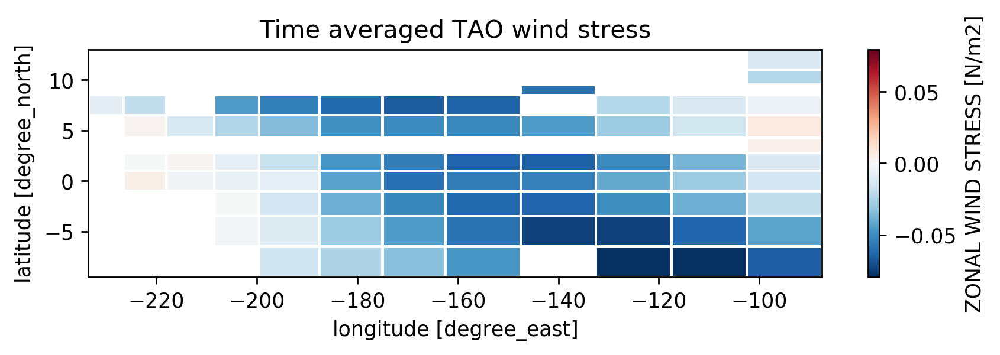

In [ ]:
tau.mean('time').taux.plot(edgecolor='w')
plt.gcf().set_size_inches((8, 2))
plt.gca().set_title('Time averaged TAO wind stress')

In [ ]:
cluster.scale(24)

In [ ]:
# 37 seconds

%%time 
ds0 = xr.open_mfdataset("/glade/p/cesm/community/ASD-HIGH-RES-CESM1/hybrid_v5_rel04_BC5_ne120_t12_pop62/ocn/proc/tseries/monthly/*UVEL*.nc", parallel=True, concat_dim="time", combine='nested')

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: In xarray version 0.13 the default behaviour of `open_mfdataset`
will change. To retain the existing behavior, pass
combine='nested'. To use future default behavior, pass
combine='by_coords'. See
http://xarray.pydata.org/en/stable/combining.html#combining-multi

  """Entry point for launching an IPython kernel.
/gpfs/u/home/dcherian/python/xarray/xarray/backends/api.py:931: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset`) to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in future, please use the new
`combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  from_openmfds=True,


CPU times: user 23.5 s, sys: 5.44 s, total: 28.9 s
Wall time: 34 s


<xarray.Dataset>
Dimensions:             (d2: 2, nlat: 2400, nlon: 3600, time: 504, z_t: 62, z_t_150m: 15, z_w: 62, z_w_bot: 62, z_w_top: 62)
Coordinates:
  * z_t_150m            (z_t_150m) float32 500.0 1500.0 ... 13500.0 14500.0
  * z_t                 (z_t) float32 500.0 1500.0 ... 562499.06 587499.06
  * z_w                 (z_w) float32 0.0 1000.0 2000.0 ... 549999.06 574999.06
  * z_w_bot             (z_w_bot) float32 1000.0 2000.0 ... 574999.06 599999.06
  * z_w_top             (z_w_top) float32 0.0 1000.0 ... 549999.06 574999.06
  * time                (time) object 0045-02-01 00:00:00 ... 0087-01-01 00:00:00
    ULONG               (time, nlat, nlon) float64 dask.array<chunksize=(12, 2400, 3600), meta=np.ndarray>
    ULAT                (time, nlat, nlon) float64 dask.array<chunksize=(12, 2400, 3600), meta=np.ndarray>
    TLONG               (time, nlat, nlon) float64 dask.array<chunksize=(12, 2400, 3600), meta=np.ndarray>
    TLAT                (time, nlat, nlon) float64 das

In [ ]:
%%time 
ds = xr.open_mfdataset("/glade/p/cesm/community/ASD-HIGH-RES-CESM1/hybrid_v5_rel04_BC5_ne120_t12_pop62/ocn/proc/tseries/monthly/*.nc", 
                       parallel=True, concat_dim='time', coords="minimal", data_vars="minimal", compat='override')

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: In xarray version 0.13 the default behaviour of `open_mfdataset`
will change. To retain the existing behavior, pass
combine='nested'. To use future default behavior, pass
combine='by_coords'. See
http://xarray.pydata.org/en/stable/combining.html#combining-multi

  


CPU times: user 19 s, sys: 504 ms, total: 19.5 s
Wall time: 23 s


\begin{align}
Ri &= \frac{2 \bar{w} h Q}{\left(b_{euc}hη_x + Δb/2 h h_x + τ_w \right)²} \\
\frac{Ri}{\bar{w}} &= \frac{10^2 10^{-8}}{\left(10×10^2×10^{-8} + 10^{-2} × 10^2 × 10^{-5} + 10^{-5}\right)²} = \frac{10^{-6}}{10^{-10}} = 10^{-4}
\end{align}

*Assumptions:*
1. Linear $w$ which is 0 at EUCmax: $w = \bar{w} (1+z/h)$ This is diathermal $w$ since this form says that $w=0$ at $z=-h$ i.e. $\bar{w}$ is diathermal velocity at the top of the layer
2. Linear $u$ between EUCmax and surface

*Choices:*
1. Fill TAO qnet using linear interpolation.
2. Running mean SSH over 20 points (20°) in longitude, then calculate gradient $η_x$

Text(0.5, 1.0, 'denominator = $(-ghη_x + Δb/2 h h_x + τ/ρ_0)²$')

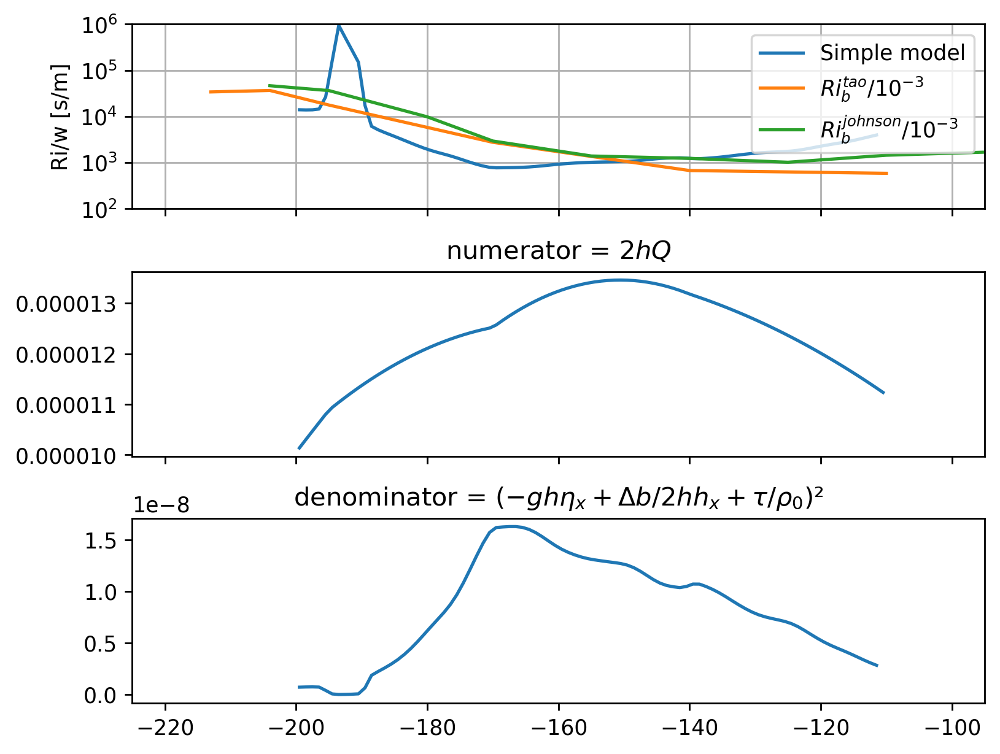

In [ ]:
xr.set_options(keep_attrs=False)

# interpolate to SSH longitudes
ds = tao.interp(longitude=ssh.longitude)
# Fill qnet using linear interpolation
ds['qnet'] = (tao.qnet.dropna('longitude')
              .interp(longitude=ssh.longitude, kwargs={'fill_value': "extrapolate"}))

db = ds.db
beuc = -9.81  # b = -gρ/ρ_{euc}
Q = ds.qnet * 9.81 * 2e-4 / (1025 * 4200)  # g α Q / (ρ c_p): heat flux in W/m² → m²/s³
h = np.abs(ds.eucmax)  # derivation integrates from z=-h to z=η, so h is positive
hx = h.differentiate('longitude')/110e3
sshx = (ssh.sel(latitude=0, method='nearest')
        .rolling(longitude=20, center=True, min_periods=5)
        .mean()
        .differentiate('longitude'))/110e3

num = 2 * h *  Q
den = (beuc * h * sshx + db/2 * h * hx + ds.tau/1025)**2

Riow = num / den
Riow.attrs['long_name'] = '$Ri/w$'
Riow.attrs['units'] = 's/m'

num.attrs['units'] = 'm³/s³'
den.attrs['units'] = 'm⁴/s⁴'


f, ax = plt.subplots(3, 1, sharex=True, sharey=False, constrained_layout=True)
Riow.plot(ax=ax[0], yscale='log', ylim=[1e2, 1e6], xlim=[-225, -95], label='Simple model', _labels=False)
(10**3 * tao.Ri).plot(ax=ax[0], label='$Ri_b^{tao}/10^{-3}$', _labels=False)
(10**3 * johnson.Ri).plot(ax=ax[0], label='$Ri_b^{johnson}/10^{-3}$', _labels=False)
ax[0].legend(loc='upper right')
ax[0].set_ylabel('Ri/w [s/m]')
num.plot(ax=ax[1], _labels=False)
den.plot(ax=ax[2], _labels=False)

ax[0].set_yticks([1e2, 1e3, 1e4, 1e5, 1e6])
ax[0].grid(True)

ax[1].set_title('numerator = $2 h Q$')
ax[2].set_title('denominator = $(-ghη_x + Δb/2 h h_x + τ/ρ_0)²$')

In [ ]:
cluster.scale(0)

## Numerator terms

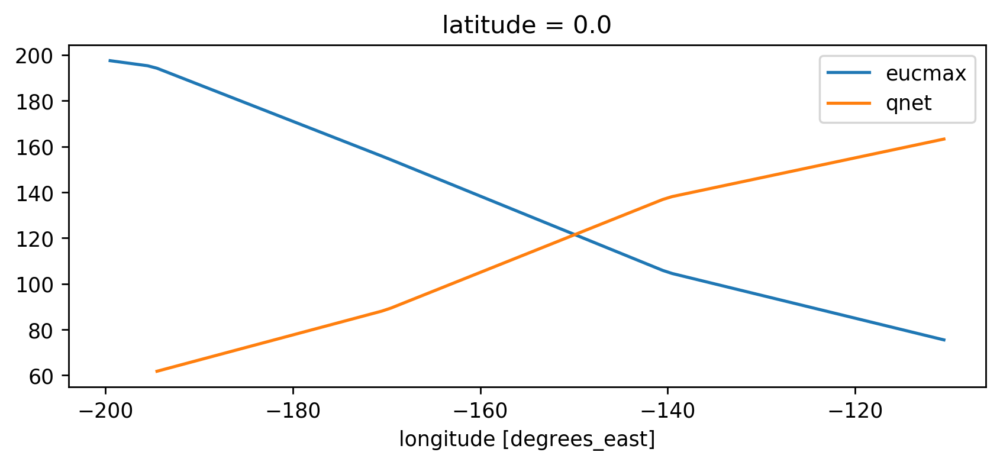

In [ ]:
h.plot(label='eucmax')
ds.qnet.plot(label='qnet')
plt.gca().legend()
plt.gca().set_ylabel('')
plt.gcf().set_size_inches((8, 3))

## Denominator terms

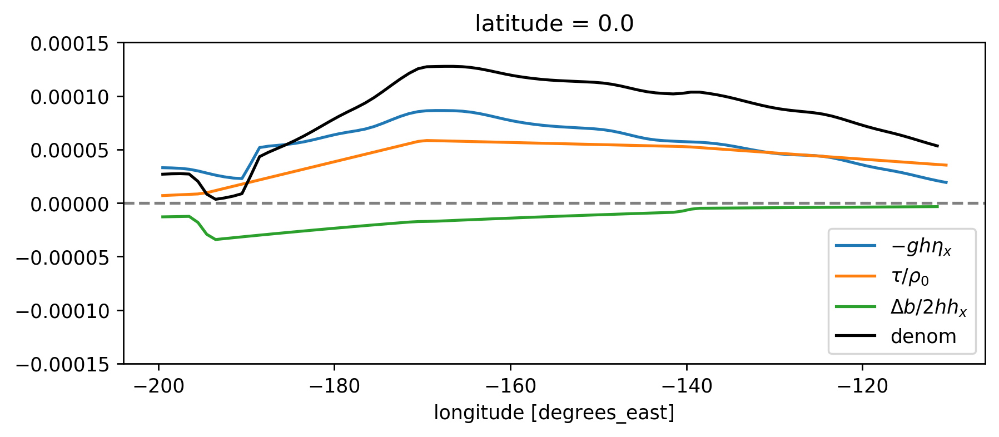

In [ ]:
# den = (beuc * h * sshx + db/2 * h * hx + ds.tau/1025)**2

(beuc * h * sshx).plot(label='$-gh η_x$')
(ds.tau/1025).plot(label='$τ/ρ_0$')
(ds.db/2 * h * hx).plot(label='$Δb/2 hh_x$', ylim=[-1.5e-4, 1.5e-4])
(beuc * h * sshx + db/2 * h * hx + ds.tau/1025).plot(label='denom', color='k')
plt.gca().legend()
dcpy.plots.liney(0)
plt.gcf().set_size_inches((8, 3))

## Medians as approx.

In [ ]:
print(f"η_x = {sshx.median().values:.1e}")
print(f"h_x = {hx.median().values:.1e}")
print(f"Δb/2 = {ds.db.median().values/2:.1e}")

η_x = -4.3e-08
h_x = -1.5e-05
Δb/2 = 6.4e-03


# Marginal instability in hourly TAO data

## read data

In [ ]:
tao = pump.obs.read_tao_zarr("gridded")
tao["Rig"] = pump.calc_tao_ri(tao[["u", "v"]], tao["T"])
tao

,Array,Chunk
Bytes,1.18 GB,8.08 MB
Shape,"(292267, 5, 101)","(10000, 1, 101)"
Count,1616 Tasks,150 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,590.38 MB,4.04 MB
Shape,"(292267, 101, 5)","(10000, 101, 1)"
Count,1616 Tasks,150 Chunks
Type,float32,numpy.ndarray
,Array,Chunk


## Make masks

### MLD calculation

In [ ]:
sst = tao.T.sel(depth=[-5, 0]).max("depth")  # account for temperature inversions
diff = (tao.T - sst).isel(depth=slice(None, -1))  # MLD at least 5m
mld = diff.depth.where(diff < -0.02).max("depth")
mld

<xarray.DataArray 'depth' (time: 292267, longitude: 5)>
dask.array<nanmax-aggregate, shape=(292267, 5), dtype=float64, chunksize=(10000, 1), chunktype=numpy.ndarray>
Coordinates:
    latitude   float32 0.0
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03

-55.0


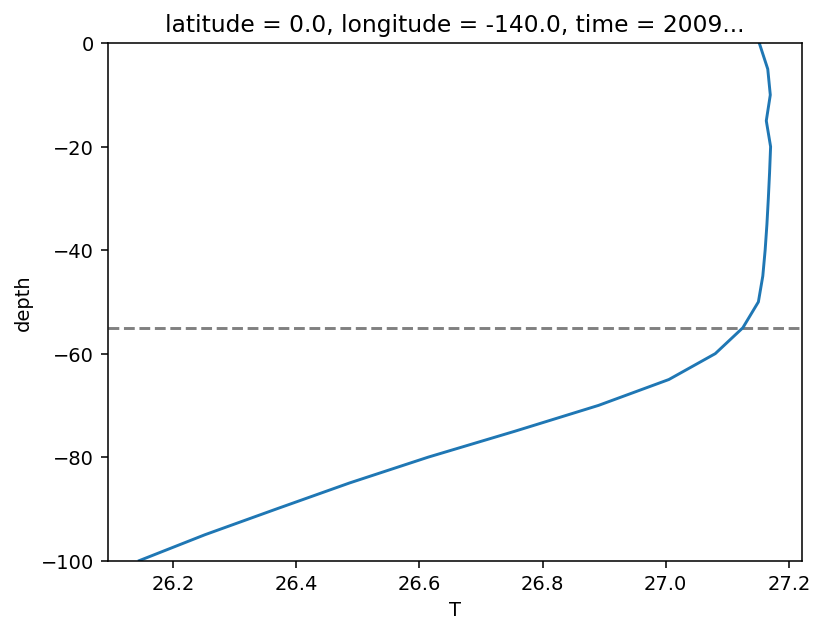

In [ ]:
region = dict(longitude=-140, time="2009-12-01 12:00")

print(mld.sel(region).values)
tao.T.sel(**region, depth=slice(-100, None)).plot(y="depth", ylim=(-100, 0))
# temp.sel(**region, depth=slice(-100, None)).plot(y="depth", marker='x')
dcpy.plots.liney(mld.sel(region))
# dcpy.plots.linex(0)

### depth of shallowest measurement

Need OK estimate of SST. This doesn't affect the end result but still a nice thing to do.

In [ ]:
shallowest = tao.depth.where(tao.T.notnull()).ffill("depth").isel(depth=-1)

### Depth of deepest measurement

Maybe I want to only keep places where I have a bunch of data?

In [ ]:
# deepest depth with valid measurement
# This is quite crude: what if the 500m instrument works but nothing above 100m works...
deepest = tao.T.depth.where(tao.T.notnull()).min("depth")
deepest.attrs["description"] = "Deepest depth with a valid observation"

### Temperature mask criterion for EUCmax

In [ ]:
# mask so that we get reasonable eucmax values.
# and don't get fooled by large near-surface velocities.
eucmask = xr.concat(
    [
        tao.T.reset_coords(drop=True).sel(longitude=-204) < 23.5,
        tao.T.reset_coords(drop=True).sel(longitude=-195) < 23.5,
        xr.full_like(tao.T.reset_coords(drop=True).sel(longitude=-170), fill_value=True),
        xr.full_like(tao.T.reset_coords(drop=True).sel(longitude=-140), fill_value=True),
        xr.full_like(tao.T.reset_coords(drop=True).sel(longitude=-110), fill_value=True),
    ],
    "longitude",
)

# number of T, U measurements
nT = tao.T.count("depth")
nU = tao.u.count("depth")
eucmax = pump.get_euc_max(
    tao.u
    .where(eucmask)
    .where((deepest < -35) & (nT > 4) & (nU > 10))
    .pipe(dcpy.interpolate.pchip_fillna, "depth")
    .reset_coords(drop=True),
    kind="data",
)

# fix 1997-1998 at -110
region = dict(longitude=-110)
eucmax_reg = eucmax.sel(**region)
ueuc = tao.u.sel(depth=eucmax_reg.fillna(0), **region).where(eucmax_reg)
# fix 1997-1998 at -110
eucmax = xr.concat(
    [
        eucmax.sel(longitude=slice(-140)),
        eucmax.sel(longitude=[-110]).where(ueuc > 0.4),
    ],
    dim="longitude",
)
eucmax

<xarray.DataArray 'depth' (time: 292267, longitude: 5)>
dask.array<concatenate, shape=(292267, 5), dtype=float64, chunksize=(292267, 4), chunktype=numpy.ndarray>
Coordinates:
    depth      (time) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    latitude   float32 ...
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
Attributes:
    long_name:  Depth of EUC max
    units:      m

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/IPython/core/events.py:88: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


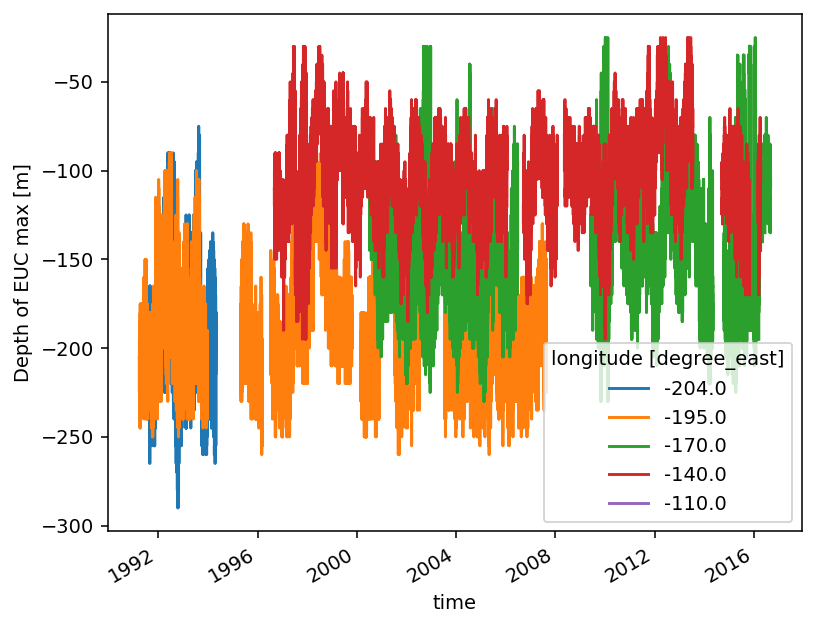

In [ ]:
eucmax.plot.line(x="time")

### Assign mask variables as coords

In [ ]:
tao = tao.assign_coords(
    eucmax=eucmax.reset_coords(drop=True),
    mld=mld.reset_coords(drop=True),
    deepest=deepest.reset_coords(drop=True),
    zeuc=tao.depth - eucmax.reset_coords(drop=True),
)
tao

<xarray.Dataset>
Dimensions:    (depth: 101, longitude: 5, time: 292267)
Coordinates:
  * depth      (depth) float64 -500.0 -495.0 -490.0 -485.0 ... -10.0 -5.0 0.0
    latitude   float32 ...
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    eucmax     (time, longitude) float64 dask.array<chunksize=(292267, 4), meta=np.ndarray>
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    zeuc       (depth, time, longitude) float64 dask.array<chunksize=(101, 292267, 4), meta=np.ndarray>
Data variables:
    T          (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    u          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>
    v          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>
    dens       (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    Rig        (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>

In [ ]:
if "_FillValue" in tao.time.encoding:
    del tao.time.encoding["_FillValue"]
for var in tao.variables:
    if "chunks" in tao[var].encoding:
        del tao[var].encoding["chunks"]
tao.unify_chunks().to_zarr("tao-gridded-ancillary.zarr", mode="w")

### test deepest

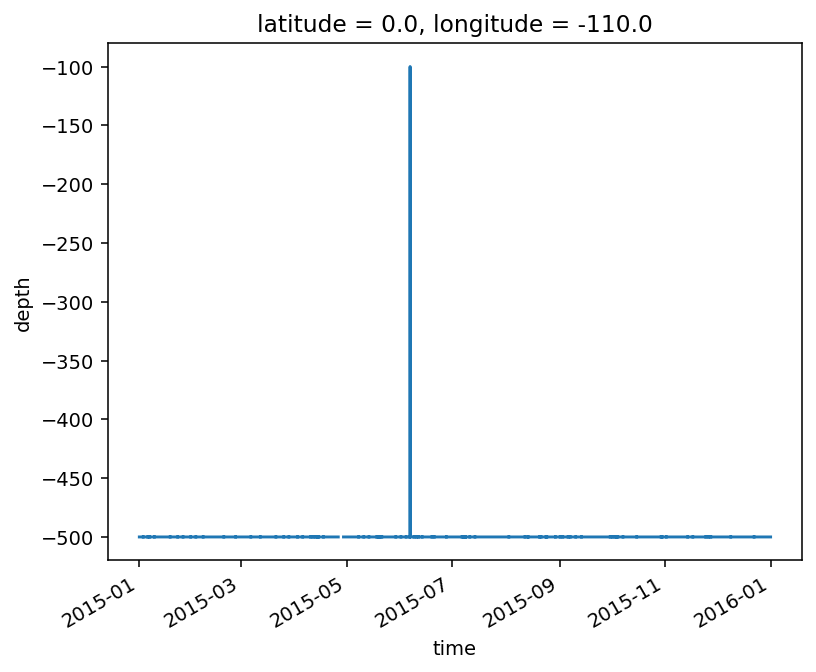

In [ ]:
deepest.sel(longitude=-110, time="2015").plot(x="time")

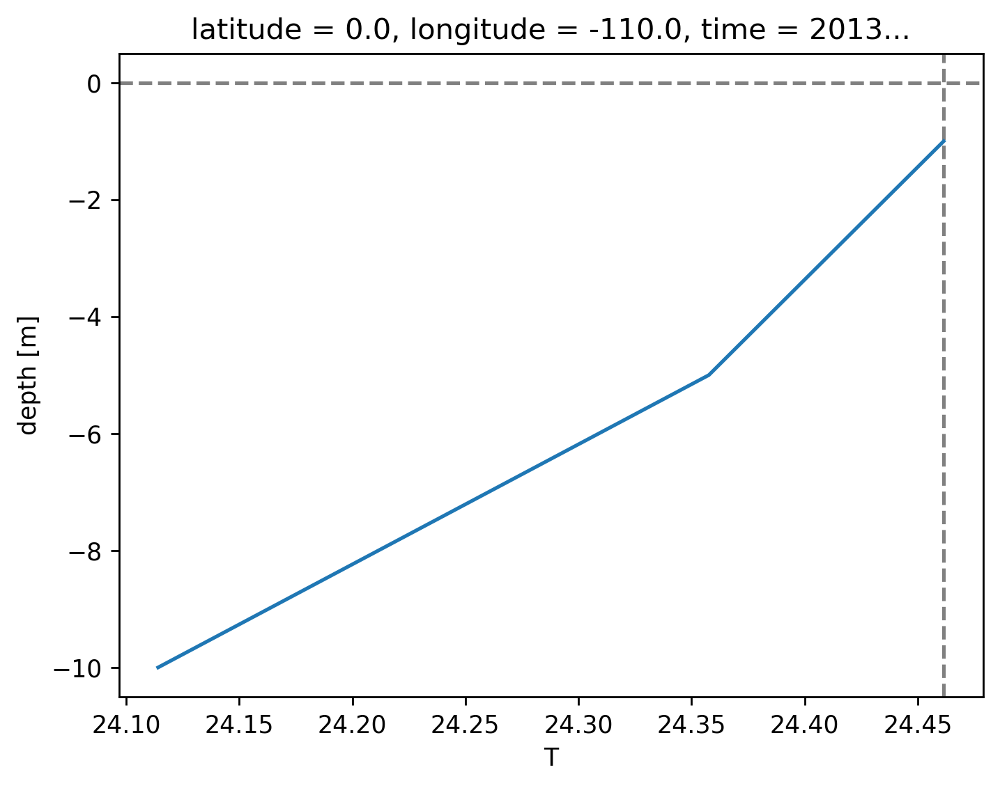

In [ ]:
def debug_mld(**region):
    filled.sel(**region).plot(y="depth")
    dcpy.plots.liney(mld.sel(**region))
    dcpy.plots.linex(sst.sel(**region))
    
debug_mld(longitude=-110, time="2013-05-01 00:00")

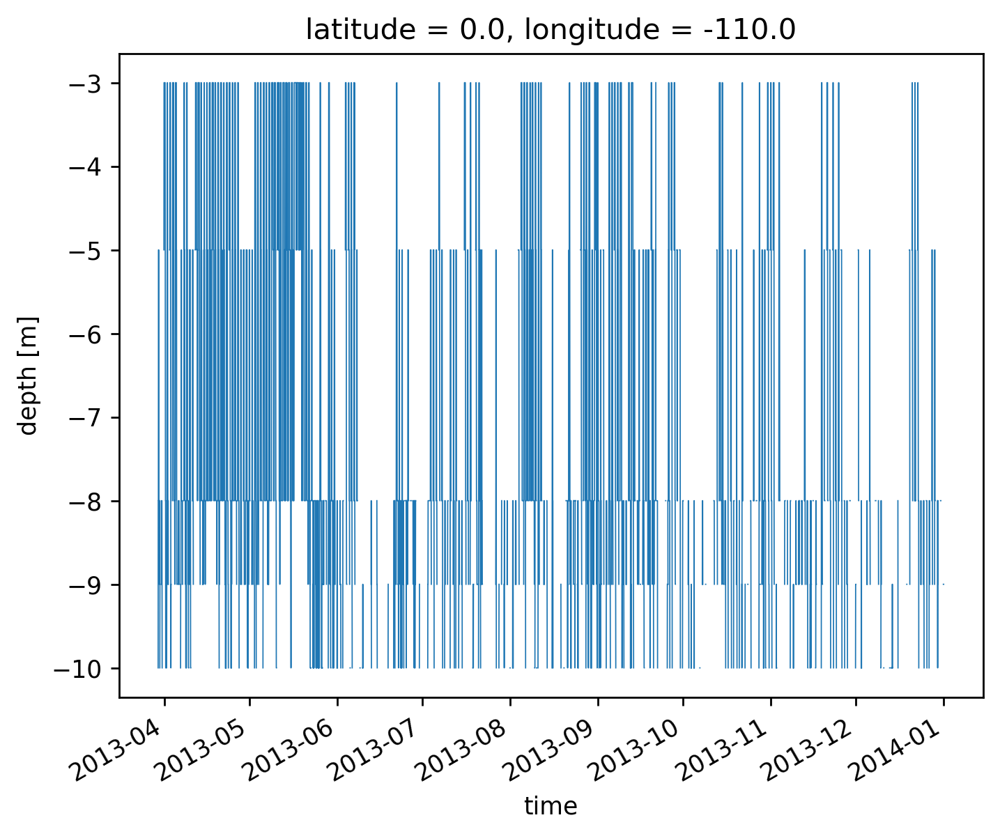

In [ ]:
mld.sel(longitude=-110, time="2013").plot(x="time", lw=0.5)

In [ ]:
eucmax.sel(longitude=-110).plot(x="time", color='k', lw=1)

In [ ]:
tao.u.sel(longitude=-110, time=slice("1996", "2000")).plot(x="time")
eucmax.sel(longitude=-110, time=slice("1996", "2000")).plot(x="time", color='k', lw=1)

In [ ]:
plt.figure()
(eucmax.sel(longitude=-170)
.where(ueuc > 0.5)
.sel(time=slice("1996", "2000"))
.plot(x="time", color='k', lw=1))

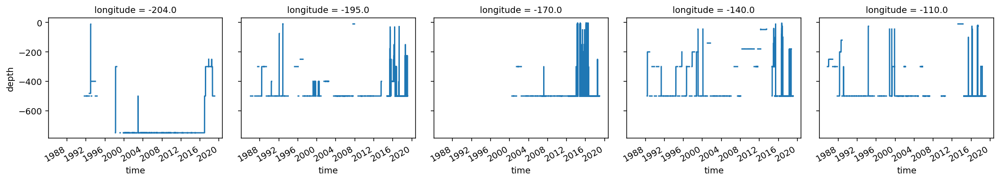

In [ ]:
deepest.compute().plot(col="longitude")

## complicating factors

### EUCmax needs to account for density

Use a temperature based mask and filter based on number of u, T observations.

In [ ]:
# mask so that we get reasonable eucmax values.
# and don't get fooled by large near-surface velocities.
eucmask = xr.concat(
    [
        tao.T.pipe(dcpy.interpolate.pchip_fillna, "depth").sel(longitude=-204) < 23.5,
        tao.T.pipe(dcpy.interpolate.pchip_fillna, "depth").sel(longitude=-195) < 23.5,
        xr.full_like(tao.T.sel(longitude=-170), fill_value=True),
        xr.full_like(tao.T.sel(longitude=-140), fill_value=True),
        xr.full_like(tao.T.sel(longitude=-110), fill_value=True),
    ],
    "longitude",
)

# number of T, U measurements
nT = tao.T.count("depth")
nU = tao.u.count("depth")

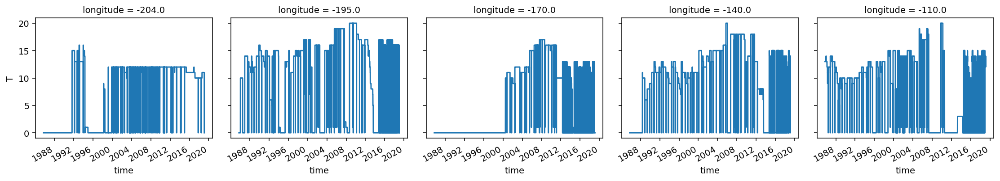

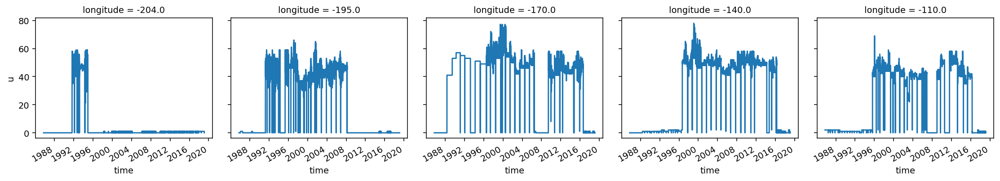

In [ ]:
nT.plot(x="time", col="longitude")
tao.u.count("depth").compute().plot(x="time", col="longitude")

In [ ]:
pump.get_euc_max(tao.u
                 .where(eucmask)
                 .where((deepest < -35) & (nT > 4) & (nU > 10))
                 .sel(longitude=-204)
                 .pipe(dcpy.interpolate.pchip_fillna, "depth")
                ).groupby("time.year").count()

# .plot(x="time")

<xarray.DataArray 'depth' (year: 35)>
array([   0,    0,    0,    0,    0,    0, 3016, 8211, 7786, 2827,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0])
Coordinates:
    latitude   float32 0.0
    longitude  float32 -204.0
  * year       (year) int64 1985 1986 1987 1988 1989 ... 2016 2017 2018 2019
Attributes:
    long_name:  Depth of EUC max
    units:      m

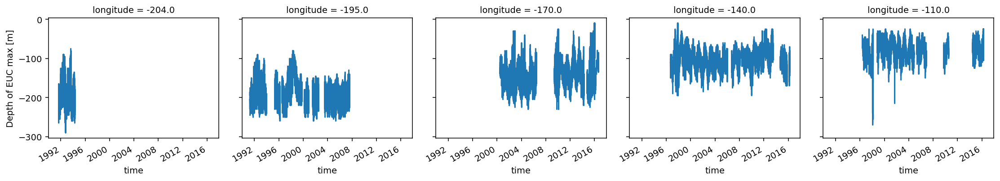

In [ ]:
%matplotlib inline

eucmax = pump.get_euc_max(
    tao.u
    .where(eucmask)
    .where((deepest < -35) & (nT > 4) & (nU > 10))
    .pipe(dcpy.interpolate.pchip_fillna, "depth")
    .reset_coords(drop=True),
    kind="data",
)
eucmax.plot.line(x="time", col="longitude")

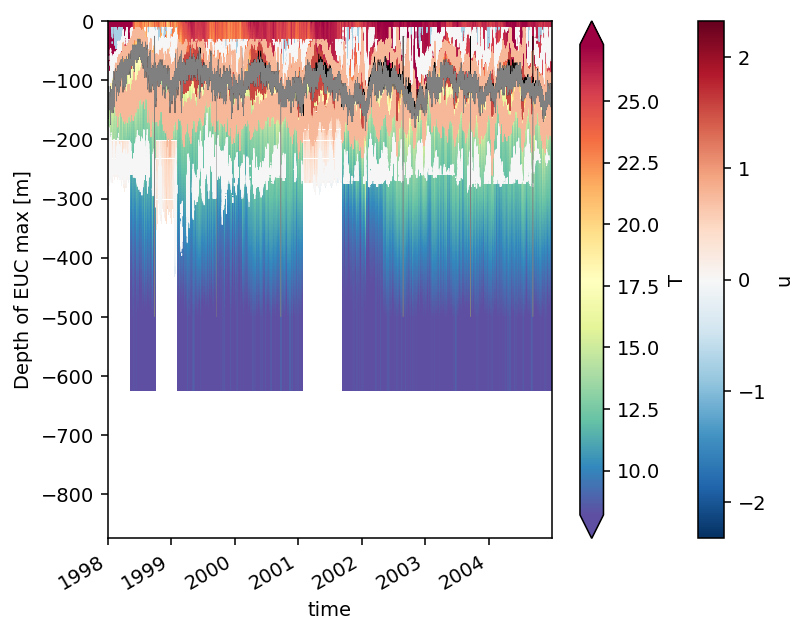

In [ ]:
subset = tao.sel(longitude=-140, time=slice("1998", "2004"))
subset.u.plot(x="time")

interp = subset.pipe(dcpy.interpolate.pchip_fillna, "depth").compute()

interp.T.plot(x="time", cmap=mpl.cm.Spectral_r, robust=True)
interp.u.plot.contour(x="time", linewidths=0.5)
eucmax = pump.get_euc_max(
    interp.u.reset_coords(drop=True),
    kind="data",
    mask=None,
)
eucmax.plot.line(x="time", lw=0.25, color="k")
eucmax = pump.get_euc_max(
    interp.u.reset_coords(drop=True),
    kind="data",
    mask=(interp.T < 23.5).reset_coords(drop=True),
)
eucmax.plot.line(x="time", lw=0.25, color="gray")

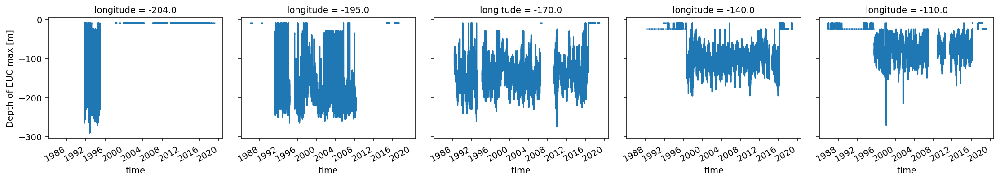

In [ ]:
%matplotlib inline

eucmax = pump.get_euc_max(
    tao.u.reset_coords(drop=True), 
    kind="data", 
    dens=None
)
eucmax.plot.line(x="time", col="longitude")

### 1. EUC disappears at 110E in 1997-1998

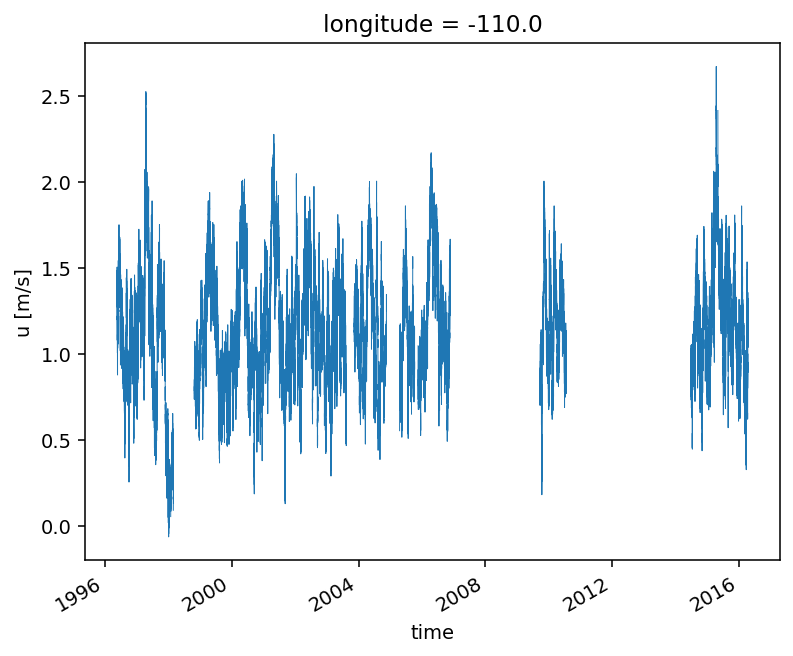

In [ ]:
%matplotlib inline
region = dict(longitude=-110)
eucmax = tao.eucmax.reset_coords(drop=True).sel(**region)
ueuc = tao.u.sel(depth=eucmax.fillna(0), **region).where(eucmax)
ueuc.plot(lw=0.5)

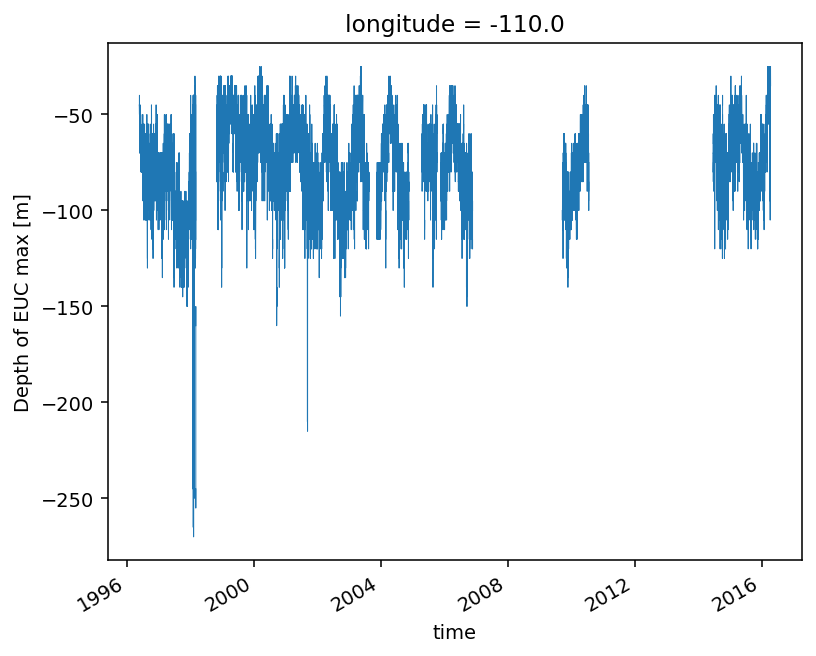

In [ ]:
eucmax.plot(x="time", lw=0.5)

### 2. Funny stuff at 170E

The detected EUCmax is artificially shallow during El Nino years. The warm pool moves eastward, so the near-surface velocity is eastward. I need to add a temperature criterion.

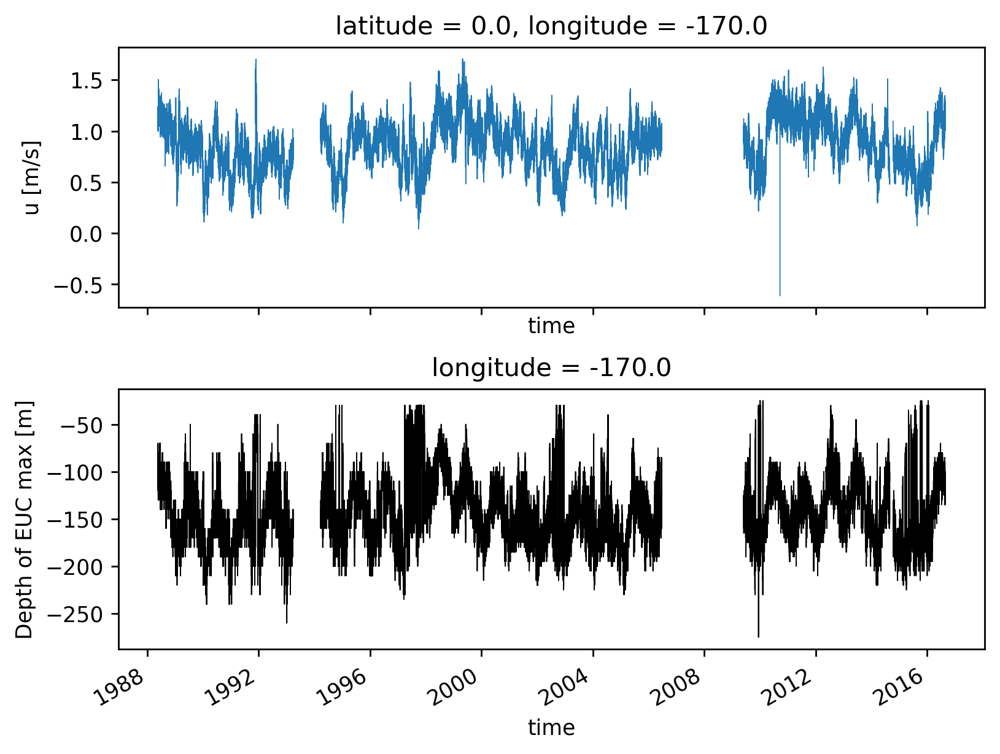

In [ ]:
%matplotlib inline

# ueuc = tao.u.sel(longitude=-170, depth=eucmax.fillna(0).sel(longitude=-170))
f, ax = plt.subplots(2, 1, sharex=True, constrained_layout=True)
ueuc.plot(lw=0.5, ax=ax[0])
eucmax.sel(longitude=-170).plot(x="time", lw=0.5, ax=ax[1], color='k')

In [ ]:
%matplotlib qt

# ueuc = tao.u.sel(longitude=-170, depth=eucmax.fillna(0).sel(longitude=-170))
f, ax = plt.subplots(2, 1, sharex=True, constrained_layout=True)
ueuc.plot(lw=0.5, ax=ax[0])
tao.T.sel(longitude=-170).plot(x="time", ax=ax[1], robust=True)
eucmax.sel(longitude=-170).plot(x="time", lw=0.5, ax=ax[1], color='k')

In [ ]:
def interp_to_euc(data):
    if sum(data.shape) == 0:
        return xr.DataArray(np.zeros((0,0)), dims=("time", "longitude"),
                           coords={"time": data.time, "longitude": data.longitude})
        
    result = ((data
               .squeeze()
               .reset_coords(drop=True)
               .interpolate_na("depth")
               .interp(depth=data.eucmax.fillna(0), 
                       time=data.time)))
    
    return result
    
tao["eucmax"] = tao.eucmax.chunk({"longitude": 1, "time": 10000})
Teuc = xr.map_blocks(interp_to_euc, tao.T)
Teuc

<xarray.DataArray (time: 292267, longitude: 5)>
dask.array<interp_to_euc-90187fdb698c4d66191233daa63df4f8-<this, shape=(292267, 5), dtype=float64, chunksize=(10000, 1), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03

In [ ]:
Teuc.sel(longitude=-140).plot()

NameError: name 'Teuc' is not defined

## Sampling: how is tao resolving MI at 140W during MAM

In [ ]:
tao140 = tao.sel(longitude=-140).load()

Looks like there's plenty of T data above the EUC max so no issues there? There's a decade where EUCmax is deeper than 75m or so...

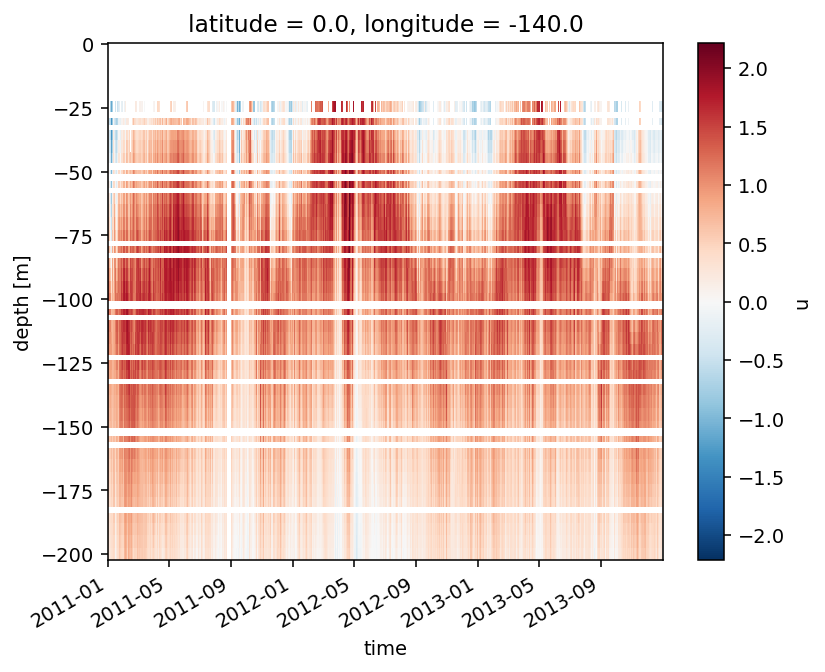

In [ ]:
tao140.u.sel(depth=slice(-200, None), time=slice("2011", "2013")).plot(x="time")
tao140.eucmax.plot(lw=0.3)
tao140.eucmax.resample(time="W").mean().plot(color='k', lw=0.6)

/gpfs/u/home/dcherian/python/xarray/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


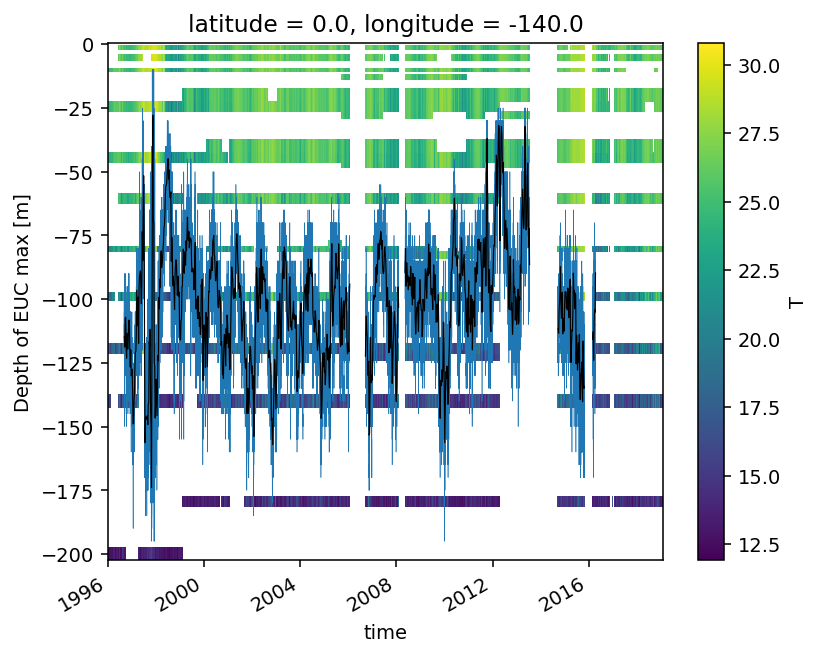

In [ ]:
tao140.T.sel(depth=slice(-200, None), time=slice("1996", None)).plot(x="time")
tao140.eucmax.plot(lw=0.3)
tao140.eucmax.resample(time="W").mean().plot(color='k', lw=0.6)

In [ ]:
tao140.eucmax.to_netcdf("eucmax-140.nc")

## calculate Rig

In [ ]:
def dask_median(obj, dim):
    return xr.apply_ufunc(xr.core.nanops.nanmedian, 
                          obj,
                          input_core_dims=[[dim]],
                          exclude_dims=set([dim]),
                          output_dtypes=[np.float64],
                          dask="parallelized"
                         )

def dask_quantile(obj, dim, q):
    def _wrapper(npa, **kwargs):
        # move quantile axis to end
        return np.moveaxis(np.nanpercentile(npa, **kwargs), 0, -1)
    return xr.apply_ufunc(_wrapper, 
                          obj,
                          input_core_dims=[[dim]],
                          exclude_dims=set([dim]),
                          output_core_dims=[["quantile"]],
                          output_dtypes=[np.float64],
                          output_sizes={"quantile": len(q)},
                          dask="parallelized",
                          kwargs={"q": q, "axis": -1},
                         ).assign_coords(quantile=q)


arr = xr.DataArray(np.random.randn(500,20))
arr[5,5] = np.nan
arr[2,3] = np.nan
npans = arr.median("dim_0")
dans = dask_median(arr.chunk({"dim_1": 1}), "dim_0").compute()

xr.testing.assert_allclose(npans, dans)

dask_qans = dask_quantile(arr.chunk({"dim_1": 1}), "dim_0", [25, 50, 75]).compute()
np_qans = dask_quantile(arr, "dim_0", [25, 50, 75])
xr.testing.assert_allclose(np_qans, dask_qans)

/gpfs/u/home/dcherian/python/xarray/xarray/core/common.py:664: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  self, group, squeeze=squeeze, restore_coord_dims=restore_coord_dims


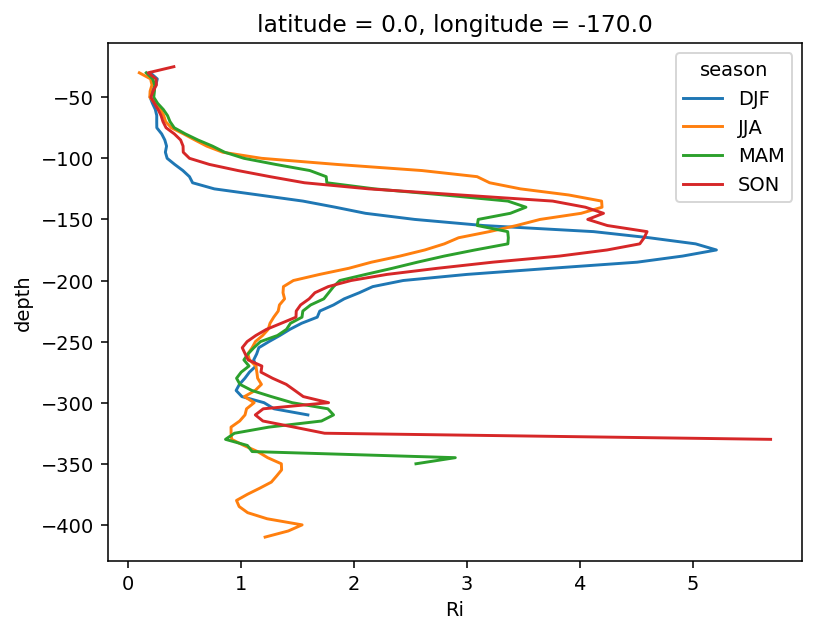

In [ ]:
sub = tao.Rig.isel(longitude=2).compute().groupby("time.season").median("time")
sub.plot(hue="season", y="depth",)

In [ ]:
median_Rig_z = tao.Rig.groupby("time.season").apply(
    lambda x: x.chunk({"time": -1}).quantile(q=0.5, dim="time")
)
median_Rig_z.load()

<xarray.DataArray 'Rig' (season: 4, longitude: 5, depth: 101)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
    quantile   float64 0.5
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * depth      (depth) float64 -500.0 -495.0 -490.0 -485.0 ... -10.0 -5.0 0.0
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    long_name:  Ri

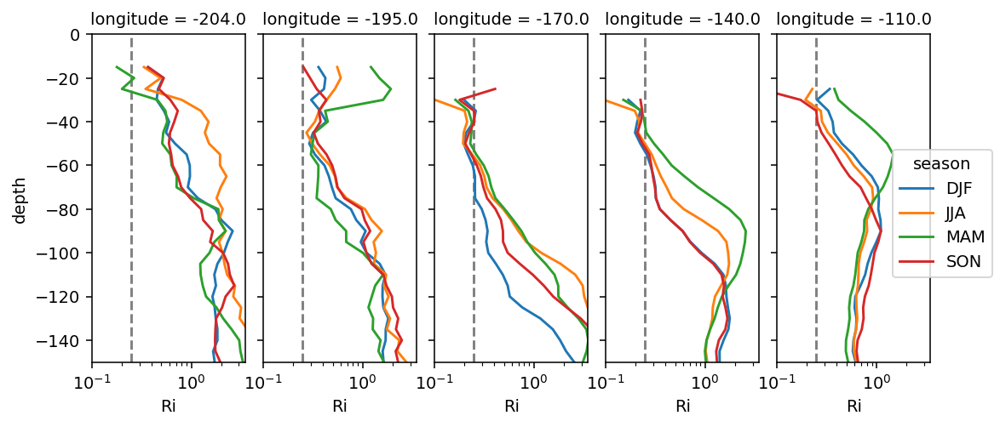

In [ ]:
fg = median_Rig_z.squeeze().plot.line(
    col="longitude",
    hue="season",
    y="depth",
    ylim=[-150, 0],
    xlim=[0.1, 3.5],
    xscale="log",
)
fg.map(lambda: dcpy.plots.linex([0.25]))
plt.gcf().set_size_inches((8, 4))

## bin in euc-relative coordinates

In [ ]:
tao = pump.obs.read_tao_zarr("ancillary")
tao

<xarray.Dataset>
Dimensions:    (depth: 101, longitude: 5, time: 292267)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * depth      (depth) float64 -500.0 -495.0 -490.0 -485.0 ... -10.0 -5.0 0.0
    eucmax     (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    zeuc       (depth, time, longitude) float64 dask.array<chunksize=(101, 10000, 1), meta=np.ndarray>
Data variables:
    Rig        (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    T          (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    dens       (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    u          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>
    v          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>

In [ ]:
good_data = tao.where((tao.depth < tao.mld) & (tao.deepest < -100) & (shallowest > -15))

interped = dcpy.interpolate.bin_to_new_coord(
    good_data.chunk({"depth": -1}),
    old_coord="depth",
    new_coord="zeuc",
    edges=np.arange(-50, 250, 5),
)

In [ ]:
interped.time.encoding.pop("_FillValue")
interped.to_zarr("tao-zeuc.zarr", mode="w", consolidated=True)

In [ ]:
tao.shallowest.plot(x="time")

AttributeError: 'Dataset' object has no attribute 'shallowest'

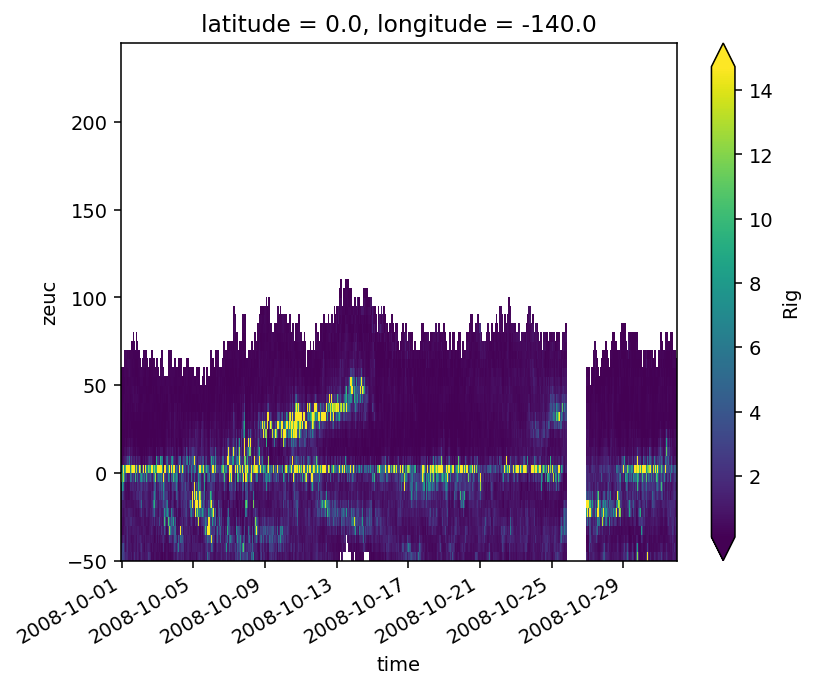

In [ ]:
interped.Rig.sel(longitude=-140, time="2008-10").plot(x="time", robust=True)

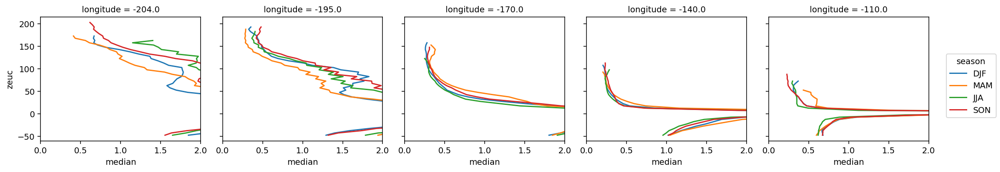

In [ ]:
seasonal["median"].where(seasonal["count"] > 60*24).plot.line(
    hue="season", y="zeuc", col="longitude", xlim=(0, 2))

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


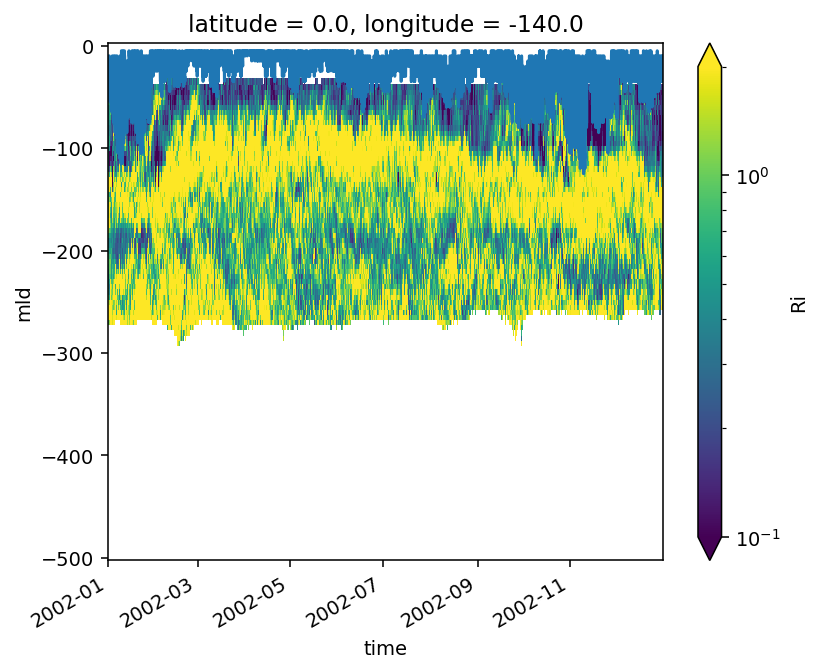

In [ ]:
subset = good_data.sel(longitude=-140, time="2002")
subset.Rig.plot(x="time", robust=True, vmin=0.1, vmax=2, norm=mpl.colors.LogNorm())
subset.mld.plot(x="time")

## interpolate to euc-relative depth grid

1. fill NaNs with pchip
2. isolate to below mixed layer
    1. where we have a reasonable estimate of sst
    2. deep enough instrument coverage
3. Linearly interpolate to a 5m grid
    
    
I really should just be binning in an EUC-relative coordinate, so it's the same Ri numbers just presented differently

In [ ]:
interped = dcpy.util.to_uniform_grid(
    tao.assign_coords(zeuc=tao.zeuc).where(
        (tao.depth < tao.mld) & (deepest < -100) & (shallowest > -15)
    ),
    coord="zeuc",
    dim="depth",
    new_coord=np.arange(-250, 250, 5),
)
interped = interped.assign_coords(depth=(interped.zeuc + eucmax).chunk(interped.chunks))
interped["Rig"] = pump.calc_tao_ri(interped[["u", "v"]], interped.T, dim="zeuc")
interped

/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)
/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)
/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)


<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267, zeuc: 100)
Coordinates:
    latitude   float32 0.0
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    eucmax     (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * zeuc       (zeuc) int64 -250 -245 -240 -235 -230 ... 225 230 235 240 245
    depth      (zeuc, time, longitude) float64 dask.array<chunksize=(100, 10000, 1), meta=np.ndarray>
Data variables:
    T          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 100), meta=np.ndarray>
    u          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 100), meta=np.ndarray>
    v          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 100), meta=np.ndarray>
    dens       (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 100), meta=np.ndarray>
    Rig        (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 100), meta=np.ndarray>

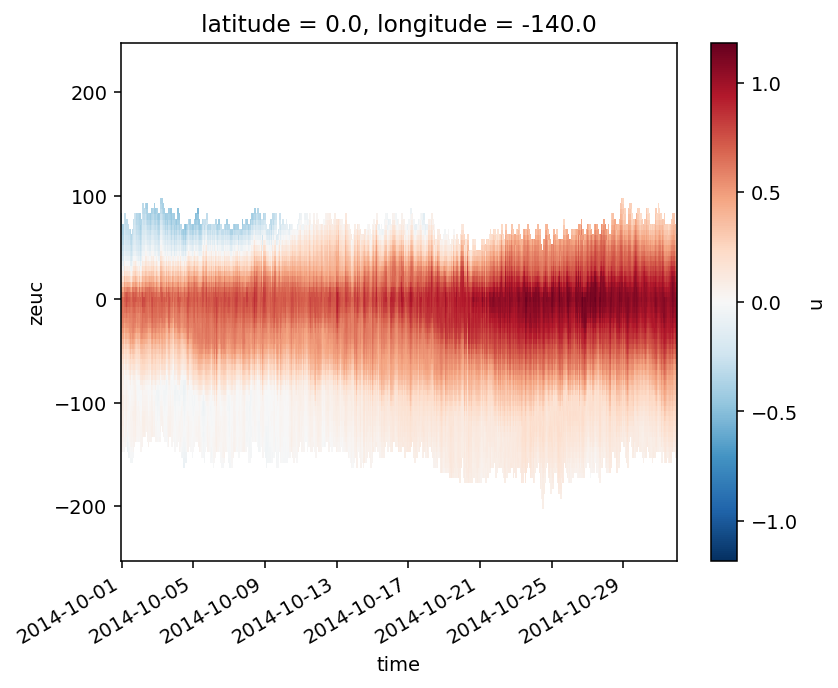

In [ ]:
interped.u.sel(time="2014-Oct", longitude=-140).compute().plot(x="time")

## Gradient Ri quantiles

In [ ]:
grouped = interped.Rig.chunk({"time": -1, "zeuc": 10}).groupby("time.season")

Ri_q = grouped.quantile(dim="time", q=[0.25, 0.5, 0.75]).reindex(
    season=["DJF", "MAM", "JJA", "SON"]
)

Ri_q = Ri_q.assign_coords(num_obs=grouped.count("time"))
Ri_q.zeuc.attrs["long_name"] = "Depth relative to EUC max"
Ri_q.zeuc.attrs["units"] = "m"
Ri_q

/gpfs/u/home/dcherian/python/xarray/xarray/core/common.py:664: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  self, group, squeeze=squeeze, restore_coord_dims=restore_coord_dims


<xarray.DataArray (season: 4, longitude: 5, zeuc: 59, quantile: 3)>
dask.array<getitem, shape=(4, 5, 59, 3), dtype=float64, chunksize=(1, 1, 10, 3), chunktype=numpy.ndarray>
Coordinates:
  * season     (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * quantile   (quantile) float64 0.25 0.5 0.75
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
    latitude   float32 0.0
    num_obs    (season, longitude, zeuc) int64 dask.array<chunksize=(1, 1, 10), meta=np.ndarray>

In [ ]:
Ri_q.load()

<xarray.DataArray (season: 4, longitude: 5, zeuc: 59, quantile: 3)>
array([[[[8.65716985e-01, 1.84699736e+00, 4.07929186e+00],
         [9.68607747e-01, 2.07586669e+00, 4.69831821e+00],
         [1.12714689e+00, 2.45510051e+00, 5.63565819e+00],
         ...,
         [8.25933339e-01, 1.21812980e+00, 2.22266901e+00],
         [3.31773526e-02, 2.15271859e-01, 6.91555336e-01],
         [6.30251313e-01, 9.59637420e-01, 1.28902353e+00]],

        [[6.99998537e-01, 1.29253461e+00, 2.86526357e+00],
         [7.26263211e-01, 1.40190939e+00, 3.03401490e+00],
         [8.14764327e-01, 1.58527315e+00, 3.47211588e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.04342082e+00, 1.80473934e+00, 3.48219512e+00],
         [1.10594958e+00, 1.94826060e+00, 3.84621979e+00],
         [1.18464712e+00, 2.10952571e+00, 4.29768611e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[5.99332633e-01, 1.01832679e+00, 2.02945611e+00],
         [6.36358415e-01, 1.09730253e+00, 2.22929311e+00],
         [6.69077456e-01, 1.17499171e+00, 2.47144998e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.93460173e-01, 6.78976245e-01, 1.35634816e+00],
         [3.96662435e-01, 6.72044675e-01, 1.30979069e+00],
         [3.89880826e-01, 6.65452753e-01, 1.31105090e+00],
         ...,
         [1.71923451e+00, 2.11843237e+00, 3.14030388e+00],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[9.64841693e-01, 2.03641443e+00, 5.24673701e+00],
         [1.00937285e+00, 2.07883897e+00, 5.36984820e+00],
         [1.07954196e+00, 2.17156104e+00, 5.51939592e+00],
         ...,
         [9.45015072e-01, 1.23069288e+00, 3.89244182e+00],
         [3.19059242e-01, 4.46329690e-01, 1.42386922e+00],
         [           nan,            nan,            nan]],

        [[9.77766440e-01, 1.94110422e+00, 4.23775491e+00],
         [1.02809324e+00, 2.09342055e+00, 4.71047287e+00],
         [1.20866875e+00, 2.40437219e+00, 5.50768658e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.06829041e+00, 1.84754009e+00, 3.53931845e+00],
         [1.11732667e+00, 1.94676703e+00, 3.81204909e+00],
         [1.15610819e+00, 2.03169397e+00, 4.13639554e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[6.45954343e-01, 1.04209220e+00, 1.87051596e+00],
         [6.91774334e-01, 1.11851238e+00, 2.00851346e+00],
         [7.23639413e-01, 1.19311723e+00, 2.28014936e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.90188842e-01, 5.96989693e-01, 1.09097169e+00],
         [3.99915480e-01, 6.17991764e-01, 1.10944998e+00],
         [4.09988742e-01, 6.36251961e-01, 1.14362343e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[8.05875978e-01, 1.64882518e+00, 3.74725616e+00],
         [8.49498749e-01, 1.81732453e+00, 4.24185284e+00],
         [9.22981317e-01, 1.94493706e+00, 4.58776057e+00],
         ...,
         [3.77534561e-01, 5.81013898e

In [ ]:
Ri_q.to_netcdf("tao-hourly-Ri-seasonal-percentiles.nc")

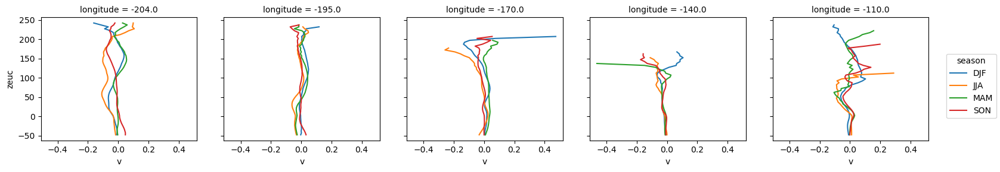

In [ ]:
grouped = interped.groupby("time.season")
seasonal = grouped.mean().compute()

seasonal.v.plot(y="zeuc", col="longitude", hue="season")

/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:107: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  xplt = darray.transpose(ydim, huedim)


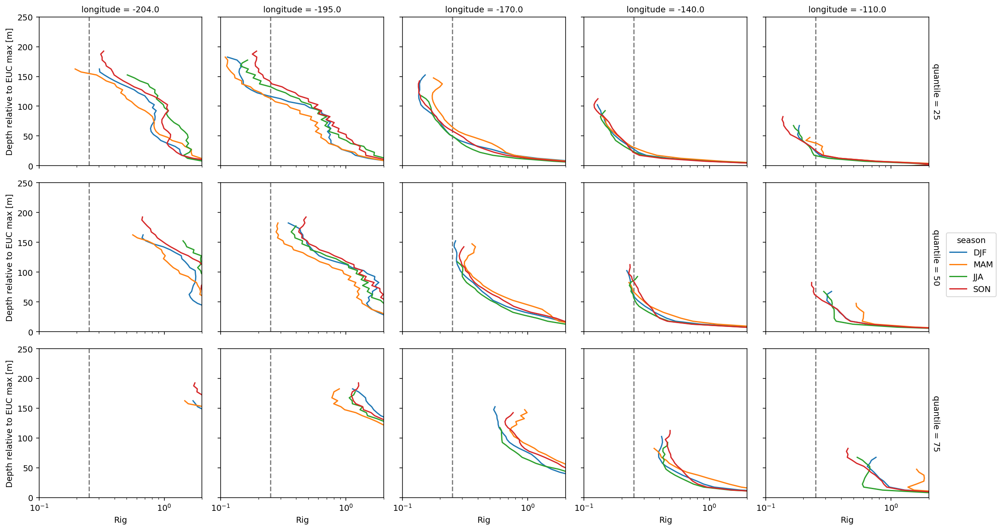

In [ ]:
%matplotlib inline

fg = Ri_q.where(Ri_q.num_obs > 90 * 24).plot.line(
    row="quantile", 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))

/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:107: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  xplt = darray.transpose(ydim, huedim)
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeOneSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeTwoSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeThreeSym'] not found. Falling back to DejaVu Sans.
find

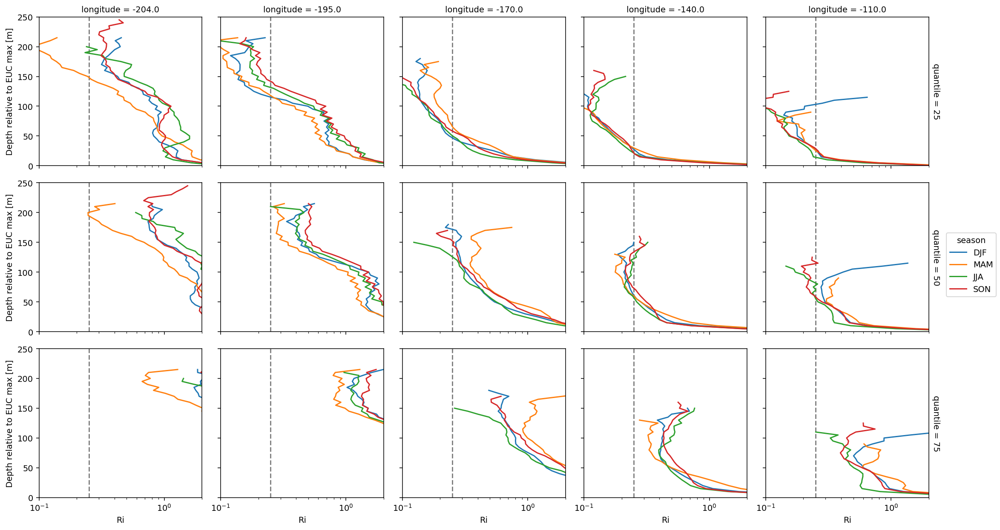

In [ ]:
%matplotlib inline

fg = Ri_q.where(Ri_q.num_obs > 90).plot.line(
    row="quantile", 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))

#fg.fig.suptitle("25,50,75 percentile gradient Ri from all available hourly TAO data.", y=1.0)
#fg.fig.savefig("images/tao-marginal-stability-hourly-euc-coordinates.png", dpi=200)

## Median in euc-relative coordinate

In [ ]:
Ri_q = xr.load_dataarray("tao-hourly-Ri-seasonal-percentiles.nc")
Ri_q

<xarray.DataArray (season: 4, longitude: 5, zeuc: 59, quantile: 3)>
array([[[[8.65716985e-01, 1.84699736e+00, 4.07929186e+00],
         [9.68607747e-01, 2.07586669e+00, 4.69831821e+00],
         [1.12714689e+00, 2.45510051e+00, 5.63565819e+00],
         ...,
         [8.25933339e-01, 1.21812980e+00, 2.22266901e+00],
         [3.31773526e-02, 2.15271859e-01, 6.91555336e-01],
         [6.30251313e-01, 9.59637420e-01, 1.28902353e+00]],

        [[6.99998537e-01, 1.29253461e+00, 2.86526357e+00],
         [7.26263211e-01, 1.40190939e+00, 3.03401490e+00],
         [8.14764327e-01, 1.58527315e+00, 3.47211588e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.04342082e+00, 1.80473934e+00, 3.48219512e+00],
         [1.10594958e+00, 1.94826060e+00, 3.84621979e+00],
         [1.18464712e+00, 2.10952571e+00, 4.29768611e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[5.99332633e-01, 1.01832679e+00, 2.02945611e+00],
         [6.36358415e-01, 1.09730253e+00, 2.22929311e+00],
         [6.69077456e-01, 1.17499171e+00, 2.47144998e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.93460173e-01, 6.78976245e-01, 1.35634816e+00],
         [3.96662435e-01, 6.72044675e-01, 1.30979069e+00],
         [3.89880826e-01, 6.65452753e-01, 1.31105090e+00],
         ...,
         [1.71923451e+00, 2.11843237e+00, 3.14030388e+00],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[9.64841693e-01, 2.03641443e+00, 5.24673701e+00],
         [1.00937285e+00, 2.07883897e+00, 5.36984820e+00],
         [1.07954196e+00, 2.17156104e+00, 5.51939592e+00],
         ...,
         [9.45015072e-01, 1.23069288e+00, 3.89244182e+00],
         [3.19059242e-01, 4.46329690e-01, 1.42386922e+00],
         [           nan,            nan,            nan]],

        [[9.77766440e-01, 1.94110422e+00, 4.23775491e+00],
         [1.02809324e+00, 2.09342055e+00, 4.71047287e+00],
         [1.20866875e+00, 2.40437219e+00, 5.50768658e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.06829041e+00, 1.84754009e+00, 3.53931845e+00],
         [1.11732667e+00, 1.94676703e+00, 3.81204909e+00],
         [1.15610819e+00, 2.03169397e+00, 4.13639554e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[6.45954343e-01, 1.04209220e+00, 1.87051596e+00],
         [6.91774334e-01, 1.11851238e+00, 2.00851346e+00],
         [7.23639413e-01, 1.19311723e+00, 2.28014936e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.90188842e-01, 5.96989693e-01, 1.09097169e+00],
         [3.99915480e-01, 6.17991764e-01, 1.10944998e+00],
         [4.09988742e-01, 6.36251961e-01, 1.14362343e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[8.05875978e-01, 1.64882518e+00, 3.74725616e+00],
         [8.49498749e-01, 1.81732453e+00, 4.24185284e+00],
         [9.22981317e-01, 1.94493706e+00, 4.58776057e+00],
         ...,
         [3.77534561e-01, 5.81013898e

In [ ]:
median_Rig = Ri_q.sel(quantile=0.5, zeuc=slice(0, None))
median_Rig

<xarray.DataArray (season: 4, longitude: 5, zeuc: 49)>
array([[[1.21434122e+01, 5.20354724e+00, 3.50501919e+00, 3.30736311e+00,
         3.33031631e+00, 3.43964060e+00, 2.92148757e+00, 2.48129720e+00,
         2.11243240e+00, 1.83912229e+00, 1.69382899e+00, 1.61765319e+00,
         1.57829252e+00, 1.65197799e+00, 1.67660646e+00, 1.70361004e+00,
         1.75811871e+00, 1.77633452e+00, 1.78274006e+00, 1.77130445e+00,
         1.76453557e+00, 1.59982041e+00, 1.53944503e+00, 1.46579473e+00,
         1.38052897e+00, 1.36555182e+00, 1.22801891e+00, 1.11480848e+00,
         9.81393217e-01, 8.09430894e-01, 7.11033315e-01, 6.64250979e-01,
         6.77348794e-01, 6.59767973e-01, 6.68314872e-01, 6.45685835e-01,
         6.25755328e-01, 6.47728194e-01, 6.16354965e-01, 7.43610355e-01,
         7.47971748e-01, 7.51553840e-01, 6.64788050e-01, 6.37038637e-01,
         7.09365153e-01, 1.08899569e+00, 1.21812980e+00, 2.15271859e-01,
         9.59637420e-01],
        [1.13882227e+01, 4.77078332e+00, 3.17914688e+00, 2.61438944e+00,
         2.32290267e+00, 2.03380830e+00, 1.79832267e+00, 1.61383103e+00,
         1.51623494e+00, 1.46151757e+00, 1.53912420e+00, 1.50846894e+00,
         1.62729495e+00, 1.62687128e+00, 1.76641538e+00, 1.71702053e+00,
         1.82824524e+00, 1.68400249e+00, 1.69879042e+00, 1.47777091e+00,
         1.38645753e+00, 1.11946488e+00, 1.01298141e+00, 8.26534889e-01,
         6.92515550e-01, 6.09600706e-01, 5.75299815e-01, 5.40169666e-01,
         5.15796523e-01, 4.88624275e-01, 4.84976674e-01, 4.53798638e-01,
         4.52561612e-01, 4.34450104e-01, 4.29997400e-01, 3.87855213e-01,
         3.46594639e-01, 3.25506862e-01, 3.52597288e-01, 3.80018426e-01,
         3.84656549e-01, 4.43017123e-01, 4.07717999e-01, 5.74185724e-01,
         9.16682658e-01, 4.36350802e-01,            nan,            nan,
                    nan],
        [1.47684744e+01, 5.04312084e+00, 2.56775010e+00, 1.85025533e+00,
         1.51538755e+00, 1.21760241e+00, 9.54120770e-01, 7.90525610e-01,
         6.72324136e-01, 5.98292186e-01, 5.29106407e-01, 4.99256817e-01,
         4.65811035e-01, 4.33383038e-01, 4.10126868e-01, 3.87110152e-01,
         3.66788709e-01, 3.40755814e-01, 3.19803196e-01, 3.02440042e-01,
         2.89701995e-01, 2.82765766e-01, 2.75048658e-01, 2.70829288e-01,
         2.70248861e-01, 2.72051211e-01, 2.72058429e-01, 2.67041272e-01,
         2.58904990e-01, 2.60149478e-01, 2.65921342e-01, 2.79376712e-01,
         2.90498832e-01, 2.87567105e-01, 2.71350610e-01, 2.39308328e-01,
         2.84417943e-01, 2.52591608e-01, 2.24577574e-01, 1.48891455e-01,
                    nan,            nan,            nan,            nan,
                    nan,            nan,            nan,            nan,
                    nan],
        [8.36970312e+00, 2.14714176e+00, 8.60081631e-01, 5.37678636e-01,
         4.56452975e-01, 4.08223936e-01, 3.65848689e-01, 3.36680169e-01,
         3.07557415e-01, 2.86030920e-01, 2.67174971e-01, 2.53727388e-01,
         2.47924187e-01, 2.42138913e-01, 2.37619971e-01, 2.32915351e-01,
         2.35271202e-01, 2.33308752e-01, 2.29976608e-01, 2.25829450e-01,
         2.19308704e-01, 2.04431004e-01, 2.03778743e-01, 1.90089052e-01,
         1.91867722e-01, 2.53620813e-01, 2.88059360e-01, 3.41855224e-01,
         3.33964955e-01, 2.12386931e-01, 1.75787371e-01, 1.36908322e-01,
                    nan,            nan,            nan,            nan,
                    nan,            nan,            nan,            nan,
                    nan,            nan,            nan,            nan,
                    nan,            nan,            nan,            nan,
                    nan],
        [6.06131842e+00, 1.47315757e+00, 6.69238501e-01, 4.78770333e-01,
         4.38250354e-01, 4.14118137e-01, 3.88180626e-01, 3.71394866e-01,
         3.42725616e-01, 3.24029195e-01, 3.07485755e-01, 3.10154128e-01,
         3.08549184e-01, 3.35307815e-01, 3.69083744e-01, 4.11380242e-01,
         5.76389174e-01, 6.93941870e-01, 6.69

<IPython.core.display.Javascript object>


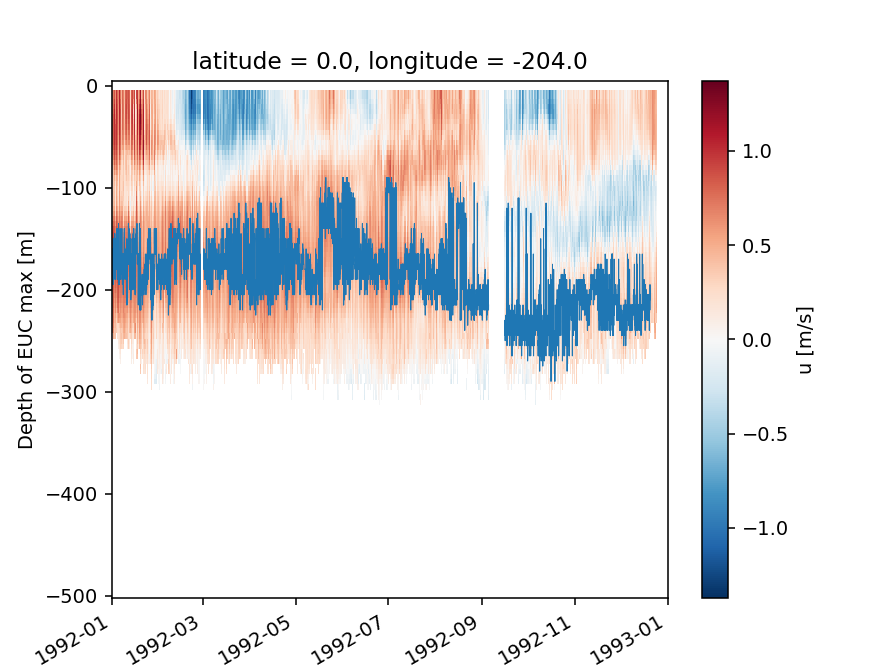

In [ ]:
%matplotlib notebook

tao.u.isel(longitude=0).sel(time=slice("1992", "1993")).plot(x="time")
tao.eucmax.isel(longitude=0).sel(time=slice("1992", "1993")).plot(
    x="time", lw=0.5, xlim=["1992", "1993"]
)

### after binning instead of reinterpolating to euc depth coordinate

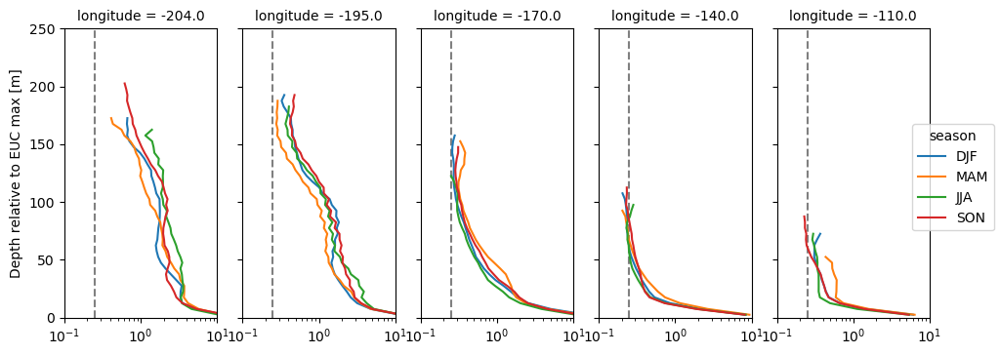

In [ ]:
fg = median_Rig.where(median_Rig.num_obs > 60*24).plot.line(    
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 10], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))
fg.fig.set_size_inches((10, 4))

### after gridding T,u to same grid

some minor differences especially at 110W

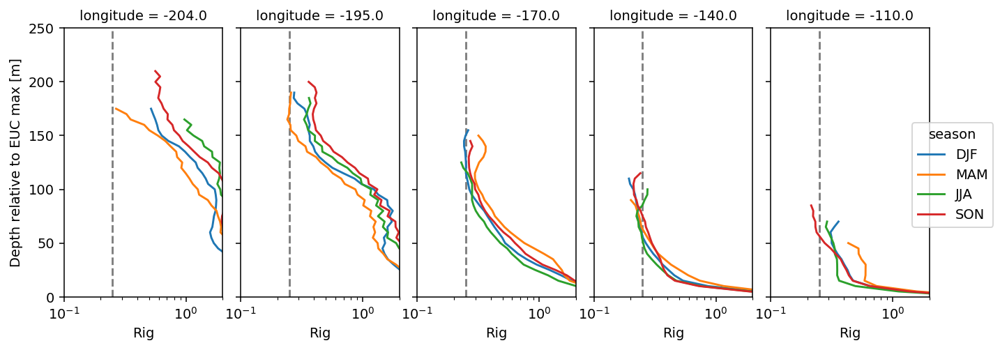

In [ ]:
%matplotlib inline

fg = Ri_q.where(Ri_q.num_obs > 60*24).sel(quantile=50).plot.line( 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))
fg.fig.set_size_inches((10, 4))


### after filling NaNs with pchip
and properly filtering eucmax

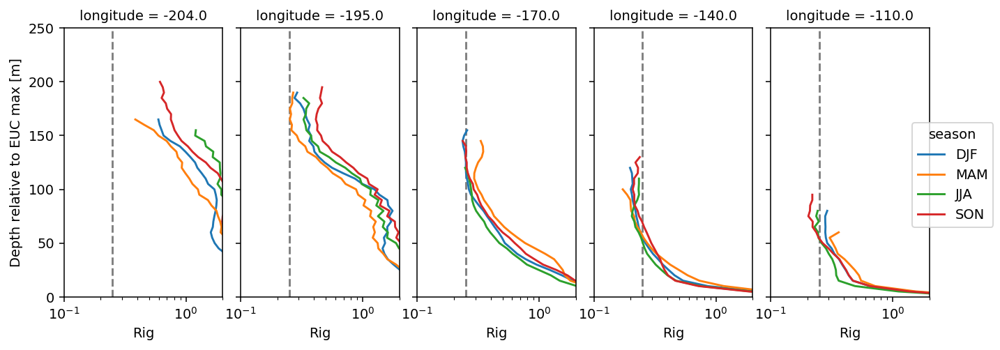

In [ ]:
fg = Ri_q.where(Ri_q.num_obs > 90*24).sel(quantile=50).plot.line( 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))
fg.fig.set_size_inches((10, 4))

fg.fig.savefig("images/tao-marginal-stability-zeuc-Rig-median.png", dpi=200)

### before filling NaNs with pchip

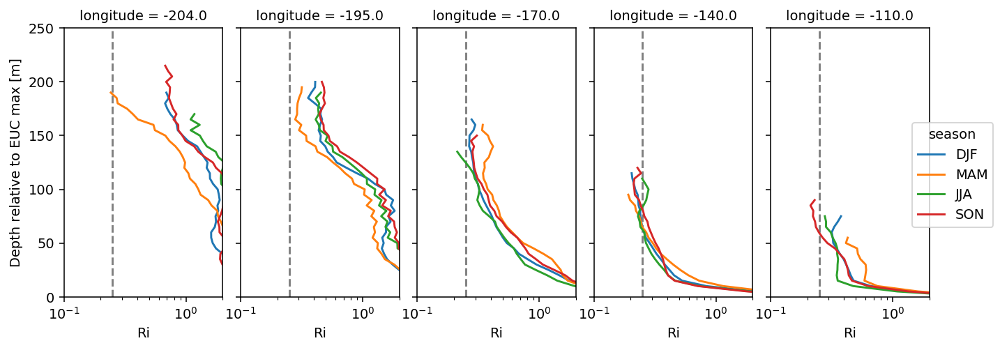

In [ ]:
fg = Ri_q.where(Ri_q.num_obs > 30*24).sel(quantile=50).plot.line( 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))
fg.fig.set_size_inches((10, 4))

fg.fig.savefig("images/tao-marginal-stability-zeuc-Rig-median.png", dpi=200)

# Ri_q.Ri.sel(quantile=50).plot(xscale="log", xlim=[0.1, 2], y="zeuc", hue="season", col="longitude", ylim=[0, 250])

### Using number of observations > 90

This seems to work best.

There is an error here. Need 90*24

[None, None, None, None, None]

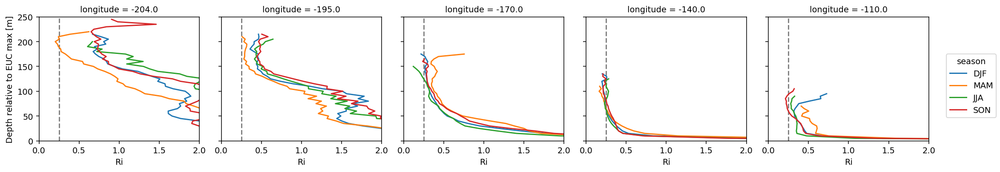

In [ ]:
fg = Ri_q.sel(quantile=50).where(Ri_q.num_obs > 90).plot.line(
    col="longitude", hue="season", y="zeuc", xlim=[0, 2], ylim=[0, 250]
)
[dcpy.plots.linex(0.25, ax=ax) for ax in fg.axes.flat]

### after removing mld

[None, None, None, None, None]

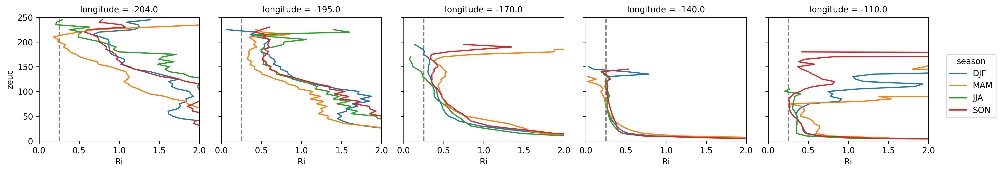

In [ ]:
fg = Ri_q.sel(quantile=50).plot.line(
    col="longitude", hue="season", y="zeuc", xlim=[0, 2], ylim=[0, 250]
)
[dcpy.plots.linex(0.25, ax=ax) for ax in fg.axes.flat]

### before removing mld

[None, None, None, None, None]

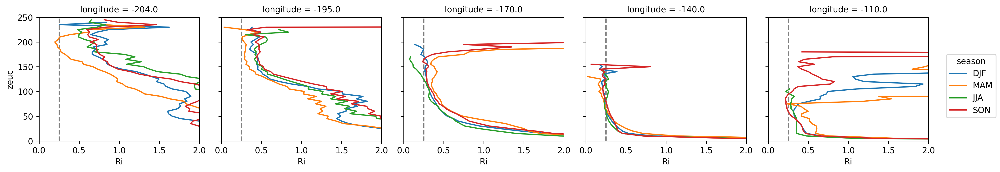

In [ ]:
fg = Ri_q.sel(quantile=50).isel(zeuc=slice(None,None,2)).plot.line(col="longitude", hue="season", y="zeuc", xlim=[0, 2], ylim=[0, 250])
[dcpy.plots.linex(0.25, ax=ax) for ax in fg.axes.flat]

### Before limiting eucmax to be deeper than 20m

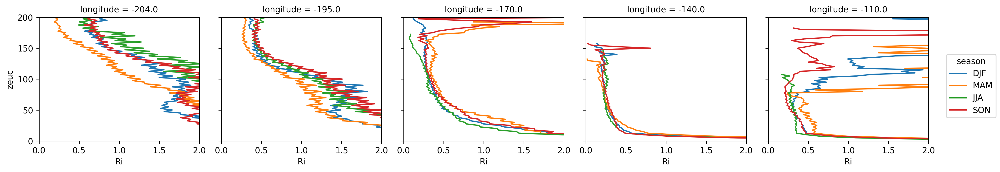

In [ ]:
Ri_q.sel(quantile=50).plot.line(col="longitude", hue="season", y="zeuc", xlim=[0, 2], ylim=[0, 200])

In [ ]:
Ri_q = (Ri.chunk({"time": -1, "depth": 25})
        .groupby("time.season")
        .apply(dask_quantile, dim="time", q=[25, 50, 75])).reindex(season=["DJF", "MAM", "JJA", "SON"])
Ri_q

<xarray.DataArray 'Ri' (season: 4, depth: 135, longitude: 5, quantile: 3)>
dask.array<getitem, shape=(4, 135, 5, 3), dtype=float64, chunksize=(1, 25, 1, 3), chunktype=numpy.ndarray>
Coordinates:
  * season     (season) object 'DJF' 'MAM' 'JJA' 'SON'
    latitude   float32 0.0
  * quantile   (quantile) int64 25 50 75
  * depth      (depth) float32 -750.0 -500.0 -495.0 -490.0 ... -3.0 -1.0 -0.0
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0

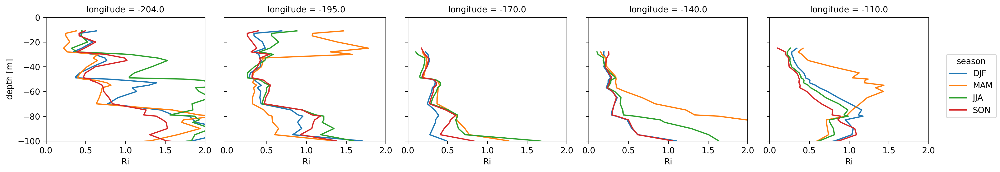

In [ ]:
Ri_q.sel(quantile=50).plot.line(y="depth", hue="season", col="longitude", xlim=[0, 2], ylim=[-100, 0])

In [ ]:
Ri.Ri.groupby("time.season").quantile([25, 50, 75])

In [ ]:
Ri.Ri.groupby("time.season").quantile

In [ ]:
median = Ri.Ri.groupby("time.season").apply(lambda x: dask_median(x, "time"))

<xarray.DataArray 'Ri' (season: 4, depth: 135, longitude: 5)>
dask.array<concatenate, shape=(4, 135, 5), dtype=float64, chunksize=(1, 10, 1), chunktype=numpy.ndarray>
Coordinates:
    latitude   float32 0.0
  * depth      (depth) float32 -750.0 -500.0 -495.0 -490.0 ... -3.0 -1.0 -0.0
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [ ]:
seasonal = Ri.groupby('time.season')

for season, Ris in seasonal:
    Rigrouped = Ris.Ri.groupby_bins(Ris.zeuc, np.arange(0, 200, 10))
    for bin, group in Rigrouped:
        print(bin)

seasonal = (Ri
            .groupby('time.season').apply(lambda x: dask_median(x, "time"))
            .reindex(season=['DJF', 'MAM', 'JJA', 'SON']))

fg = (seasonal.plot.line(col='longitude', hue='season', y='depth',
                         ylim=[-150, 0], xlim=[0.1, 3.5], xscale='log'))
fg.map(lambda: dcpy.plots.linex([0.25, 0.3]))
plt.gcf().suptitle('Seasonal median 5m Ri | Hourly mean TAO ADCP, T '
                   , y=1.02)
plt.gcf().set_size_inches((8, 4))
plt.gcf().set_dpi(200)
# f, ax = plt.subplots(1, 1, constrained_layout=True)
# f.savefig('images/tao-marginal-stability-hourly.png')

KeyboardInterrupt: 

# How good is bulk Ri vs gradient Ri

In [ ]:
# del tao.time.encoding["_FillValue"]
tao.to_zarr("tao-gridded-ancillary.zarr", mode="w", consolidated=True)

In [ ]:
tao = pump.obs.read_tao_zarr("gridded")
tao

<xarray.Dataset>
Dimensions:    (depth: 101, longitude: 5, time: 292267)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * depth      (depth) float64 -500.0 -495.0 -490.0 -485.0 ... -10.0 -5.0 0.0
    eucmax     (time, longitude) float64 dask.array<chunksize=(10000, 2), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    zeuc       (depth, time, longitude) float64 dask.array<chunksize=(101, 10000, 1), meta=np.ndarray>
Data variables:
    Rig        (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    T          (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    dens       (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    u          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>
    v          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>

In [ ]:
tao_zeuc = xr.open_zarr("tao-zeuc.zarr", consolidated=True)
tao_zeuc

<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267, zeuc: 59)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    eucmax     (time, longitude) float64 dask.array<chunksize=(292267, 5), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    T          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    dens       (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    u          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    v          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>

In [ ]:
tao_clim["Rig"] = pump.calc.calc_tao_ri(
    tao_clim[["u", "v"]].expand_dims(time=1), 
    tao_clim["T"].expand_dims(time=1)
)

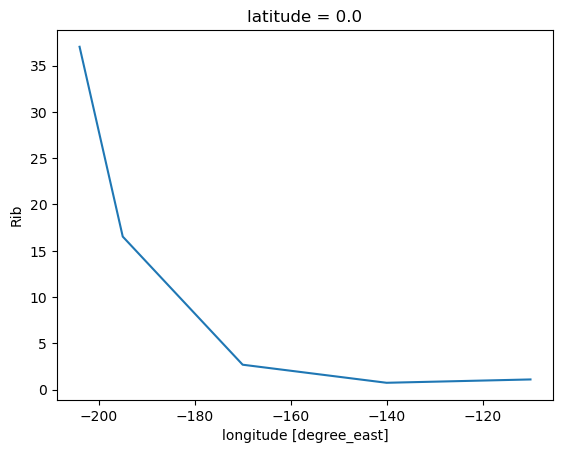

In [ ]:
tao_clim.Rib.plot(x="longitude")
# tao_clim.Rig.plot(x="longitude")

In [ ]:
interped.sel(zeuc=slice(0,None)).quantile(dim="zeuc", q=0.5).count("time").compute()

<xarray.DataArray (longitude: 5)>
array([ 21840, 107780, 102208, 136161,  97035])
Coordinates:
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    quantile   float64 0.5

In [ ]:
Ri_q = xr.load_dataarray("tao-hourly-Ri-seasonal-percentiles.nc")
Ri_q

<xarray.DataArray 'Rig' (season: 4, longitude: 5, zeuc: 59, quantile: 3)>
array([[[[8.65716985e-01, 1.84699736e+00, 4.07929186e+00],
         [9.68607747e-01, 2.07586669e+00, 4.69831821e+00],
         [1.12714689e+00, 2.45510051e+00, 5.63565819e+00],
         ...,
         [8.25933339e-01, 1.21812980e+00, 2.22266901e+00],
         [3.31773526e-02, 2.15271859e-01, 6.91555336e-01],
         [6.30251313e-01, 9.59637420e-01, 1.28902353e+00]],

        [[6.99998537e-01, 1.29253461e+00, 2.86526357e+00],
         [7.26263211e-01, 1.40190939e+00, 3.03401490e+00],
         [8.14764327e-01, 1.58527315e+00, 3.47211588e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.04342082e+00, 1.80473934e+00, 3.48219512e+00],
         [1.10594958e+00, 1.94826060e+00, 3.84621979e+00],
         [1.18464712e+00, 2.10952571e+00, 4.29768611e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[5.99332633e-01, 1.01832679e+00, 2.02945611e+00],
         [6.36358415e-01, 1.09730253e+00, 2.22929311e+00],
         [6.69077456e-01, 1.17499171e+00, 2.47144998e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.93460173e-01, 6.78976245e-01, 1.35634816e+00],
         [3.96662435e-01, 6.72044675e-01, 1.30979069e+00],
         [3.89880826e-01, 6.65452753e-01, 1.31105090e+00],
         ...,
         [1.71923451e+00, 2.11843237e+00, 3.14030388e+00],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[9.64841693e-01, 2.03641443e+00, 5.24673701e+00],
         [1.00937285e+00, 2.07883897e+00, 5.36984820e+00],
         [1.07954196e+00, 2.17156104e+00, 5.51939592e+00],
         ...,
         [9.45015072e-01, 1.23069288e+00, 3.89244182e+00],
         [3.19059242e-01, 4.46329690e-01, 1.42386922e+00],
         [           nan,            nan,            nan]],

        [[9.77766440e-01, 1.94110422e+00, 4.23775491e+00],
         [1.02809324e+00, 2.09342055e+00, 4.71047287e+00],
         [1.20866875e+00, 2.40437219e+00, 5.50768658e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.06829041e+00, 1.84754009e+00, 3.53931845e+00],
         [1.11732667e+00, 1.94676703e+00, 3.81204909e+00],
         [1.15610819e+00, 2.03169397e+00, 4.13639554e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[6.45954343e-01, 1.04209220e+00, 1.87051596e+00],
         [6.91774334e-01, 1.11851238e+00, 2.00851346e+00],
         [7.23639413e-01, 1.19311723e+00, 2.28014936e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.90188842e-01, 5.96989693e-01, 1.09097169e+00],
         [3.99915480e-01, 6.17991764e-01, 1.10944998e+00],
         [4.09988742e-01, 6.36251961e-01, 1.14362343e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[8.05875978e-01, 1.64882518e+00, 3.74725616e+00],
         [8.49498749e-01, 1.81732453e+00, 4.24185284e+00],
         [9.22981317e-01, 1.94493706e+00, 4.58776057e+00],
         ...,
         [3.77534561e-01, 5.810

In [ ]:
median_Rig = interped.sel(zeuc=slice(0, None)).quantile(dim="zeuc", q=0.5)
median_Rig

<xarray.DataArray (time: 292267, longitude: 5)>
dask.array<getitem, shape=(292267, 5), dtype=float64, chunksize=(10000, 1), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    eucmax     (time, longitude) float64 dask.array<chunksize=(292267, 5), meta=np.ndarray>
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    quantile   float64 0.5

quick fix. Take median of bulk Ri

In [ ]:
median_Rib = bulk_Ri.groupby("time.season").apply(lambda x: x.chunk({"time": -1}).quantile(q=0.5, dim="time")).compute()

/gpfs/u/home/dcherian/python/xarray/xarray/core/common.py:664: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  self, group, squeeze=squeeze, restore_coord_dims=restore_coord_dims


In [ ]:
medians = xr.Dataset()
medians["Rib"] = median_Rib
medians["Rig"] = median_Rig.sel(zeuc=slice(0,None)).median("zeuc")

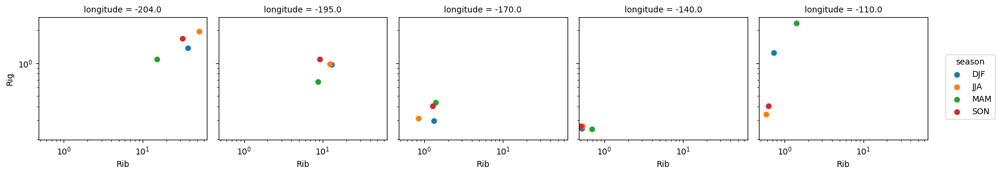

In [ ]:
fg = medians.plot.scatter(x="Rib", y="Rig", hue="season", col="longitude")
fg.axes[0,0].set_xscale("log")
fg.axes[0,0].set_yscale("log")

In [ ]:
tao_bulk = pump.calc.estimate_euc_depth_terms(
    tao, inplace=False
)
bulk_Ri = tao_bulk["Rib"]

Ri = xr.Dataset({"bulk": bulk_Ri, "gradient": median_Rig})
Ri["season"] = Ri.time.dt.season
Ri.load()

/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:393: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*arr.dims)
/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:393: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*arr.dims)


<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267)
Coordinates:
    latitude   float32 0.0
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    eucmax     (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    mld        (time, longitude) float64 nan nan nan nan ... -20.0 nan -5.0 -5.0
    deepest    (time, longitude) float64 nan nan nan nan ... nan -500.0 -500.0
    quantile   float64 0.5
Data variables:
    bulk       (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    gradient   (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    season     (time) <U3 'SON' 'SON' 'SON' 'SON' ... 'DJF' 'DJF' 'DJF' 'DJF'

In [ ]:
# Ri.time.encoding.pop("_FillValue")
Ri.to_netcdf("rib-median-rig.nc")

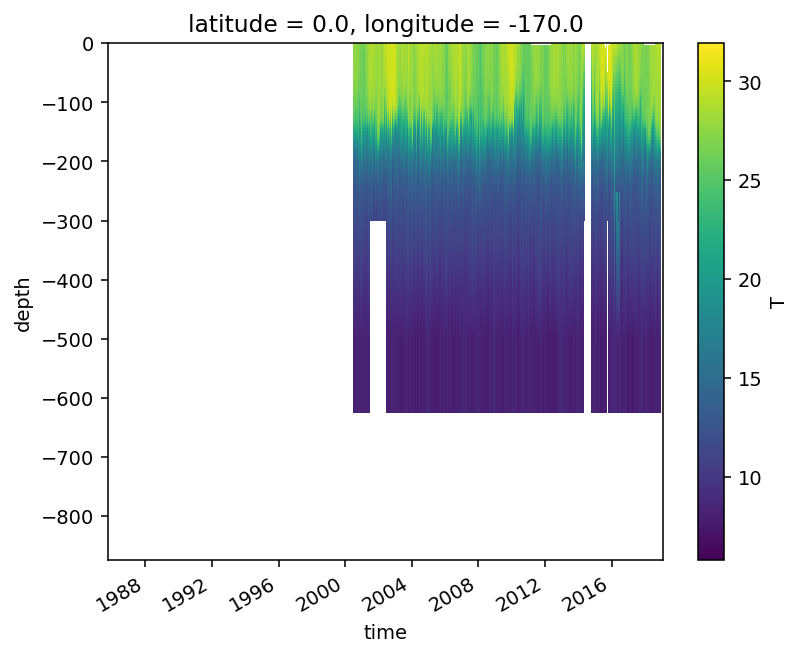

In [ ]:
tao.T.sel(longitude=-170).plot(x="time")

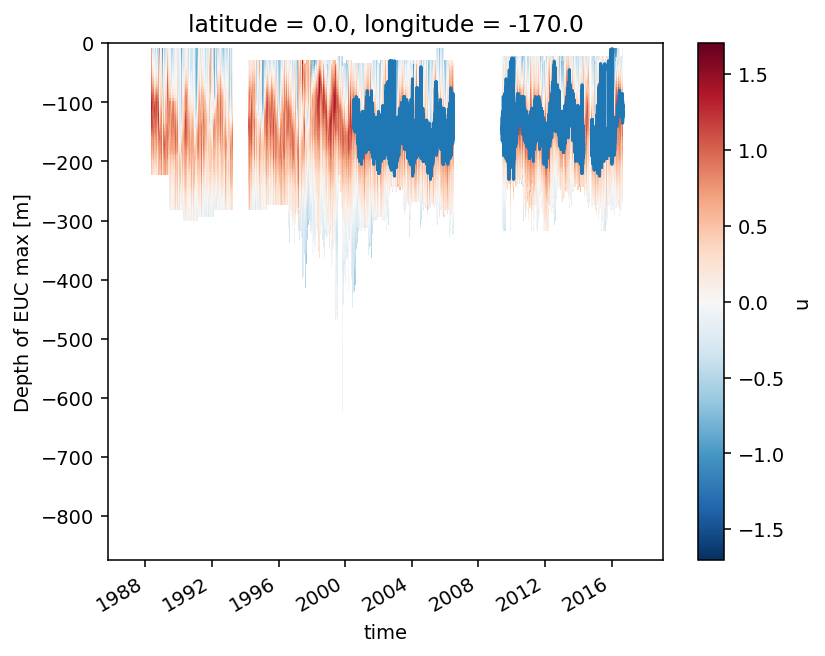

In [ ]:
tao.u.sel(longitude=-170).plot(x="time")
tao.eucmax.sel(longitude=-170).plot(x="time")

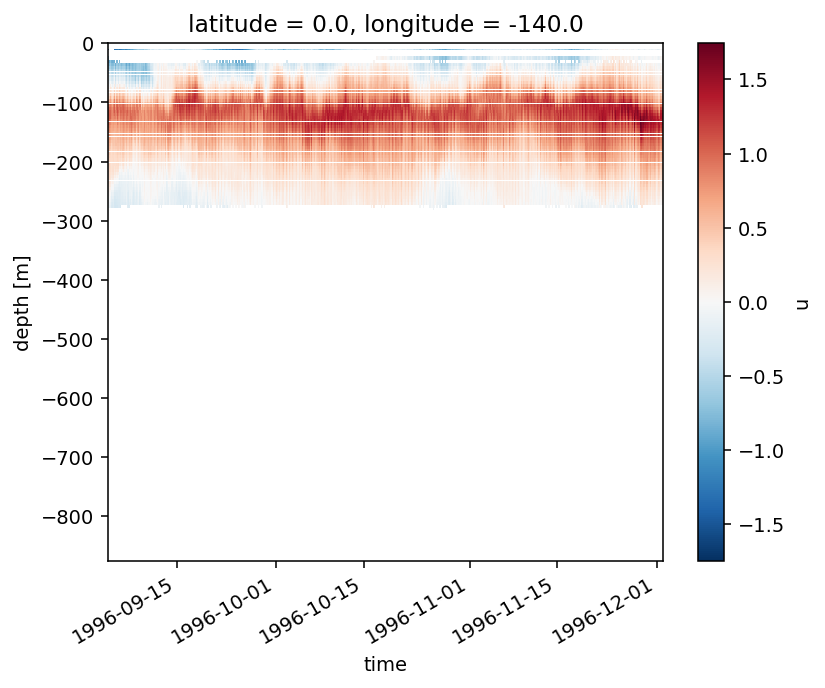

In [ ]:
tao.u.sel(longitude=-140, time=slice("1996-09-04", "1996-12-01")).plot(x="time")

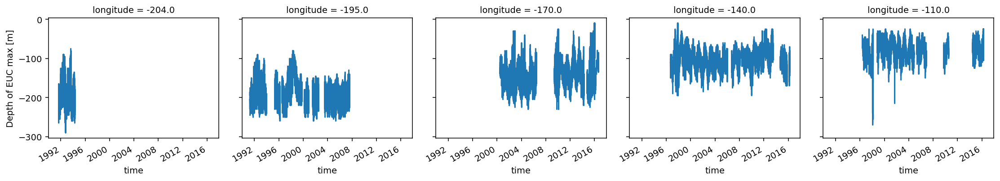

In [ ]:
tao.eucmax.plot.line(x="time", col="longitude")

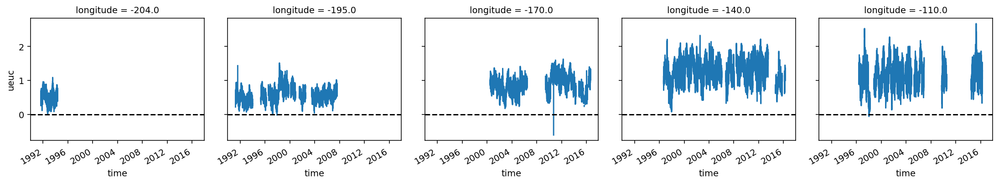

In [ ]:
fg = tao.ueuc.plot(x="time", col="longitude")
fg.map(lambda: plt.gca().axhline(0, color='k', ls='--'))

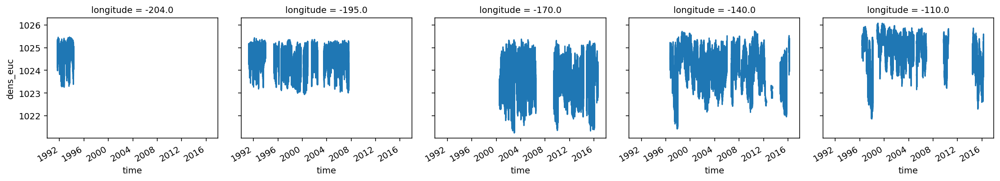

In [ ]:
tao.dens_euc.compute().plot.line(x="time", col="longitude")

In [ ]:
Ri.to_netcdf("rib-median-rig.nc")

## Estimate and plot histograms

In [ ]:
Ri = xr.load_dataset("rib-median-rig.nc")
Ri

<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267)
Coordinates:
    deepest    (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    eucmax     (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    latitude   float64 0.0
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    quantile   float64 0.5
Data variables:
    bulk       (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    gradient   (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    season     (time) object 'SON' 'SON' 'SON' 'SON' ... 'DJF' 'DJF' 'DJF' 'DJF'

In [ ]:
def plot_Ri_histograms(Ri_hist, **kwargs):

    if "season" in Ri_hist:
        kwargs.setdefault("row", "season")

    fg = Ri_hist.where(Ri_hist > 0).plot(
        col="longitude",
        x="bulk_bin",
        y="gradient_bin",
        xscale="log",
        yscale="log",
        cmap=mpl.cm.BuGn,
        cbar_kwargs={
            "orientation": "horizontal",
            # "label": "probability density",
            "aspect": 40,
            "shrink": 0.6,
            "pad": 0.1,
        },
        **kwargs
    )

    def mark_lines():
        lstyle = dict(zorder=10, lw=0.5)
        dcpy.plots.linex([0.25, 1], ax=plt.gca(), **lstyle)
        dcpy.plots.liney([0.25, 1], ax=plt.gca(), **lstyle)
        plt.gca().set_aspect(1)
        dcpy.plots.line45(ax=plt.gca(), **lstyle)

    fg.set_xlabels("$Ri_b$")
    fg.set_ylabels("$Ri_g$")
    fg.fig.set_size_inches((8, 8))
    fg.map(mark_lines)

    fg.map_dataarray(
        xr.plot.contour,
        x="bulk_bin",
        y="gradient_bin",
        colors="w",
        levels=np.linspace(*np.nanpercentile(Ri_hist, [99.1, 99.9]), 3),
        linewidths=0.3,
        add_colorbar=False,
    )

    return fg

At hourly timescales this is pretty noisy. Bulk Ri in the central Pac is O(10) when calculated from annual means. I have to show that Rib_b is a reasonable estimate of the median Ri_g over some long time scale?

In [ ]:
Ri.bulk.clip?

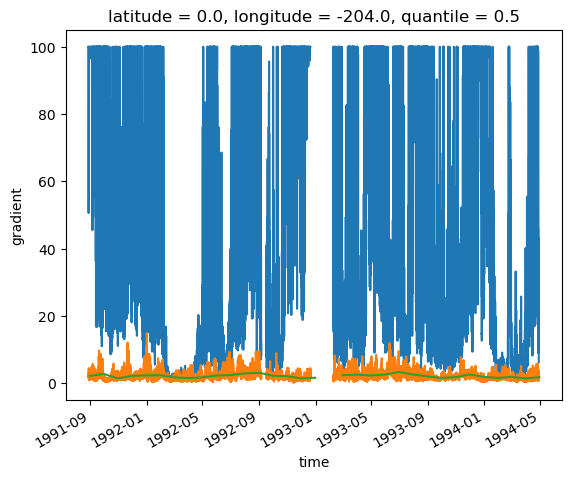

In [ ]:
lon = -204

Ri.bulk.clip(min=0, max=100).sel(longitude=lon).plot(x="time")
# Ri.bulk.clip(max=100).resample(time="M").mean().sel(longitude=lon).plot(x="time")

Ri.gradient.clip(max=100).sel(longitude=lon).plot(x="time")
Ri.gradient.clip(max=100).resample(time="M").mean().sel(longitude=lon).plot(x="time")

/gpfs/u/home/dcherian/python/xarray/xarray/core/dataarray.py:695: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data
/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:966: UserWarning: No contour levels were found within the data range.
  primitive = ax.contour(x, y, z, **kwargs)


/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


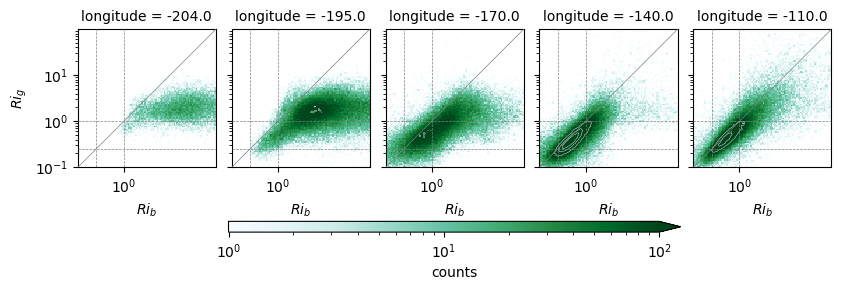

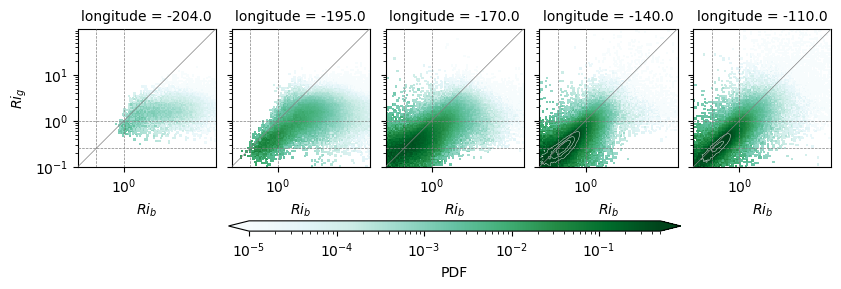

In [ ]:
def wrap_hist(ds, density=True):
    from xhistogram.xarray import histogram

    hist_over = ("time",)

    xbins = xr.DataArray(np.logspace(-1, 2, 100), dims="bulk_bin")
    ybins = xr.DataArray(np.logspace(-1, 2, 100), dims="gradient_bin")
    counts = histogram(
        ds.bulk, ds.gradient, dim=hist_over, bins=[xbins.values, ybins.values],
    )

    if density:
        dens = (
            counts
            / xbins.diff("bulk_bin")
            / ybins.diff("gradient_bin")
            / counts.sum(set(counts.dims) - set(hist_over))
        )
        dens.name = "PDF"
    else:
        dens = counts
        dens.name = "counts"
    return dens


plot_Ri_histograms(
    wrap_hist(Ri, density=False), norm=mpl.colors.LogNorm(vmin=1, vmax=100),
)
plot_Ri_histograms(
    wrap_hist(Ri, density=True), norm=mpl.colors.LogNorm(vmin=1e-5, vmax=0.5),
)

/gpfs/u/home/dcherian/python/xarray/xarray/core/dataarray.py:695: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data
/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:966: UserWarning: No contour levels were found within the data range.
  primitive = ax.contour(x, y, z, **kwargs)


/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


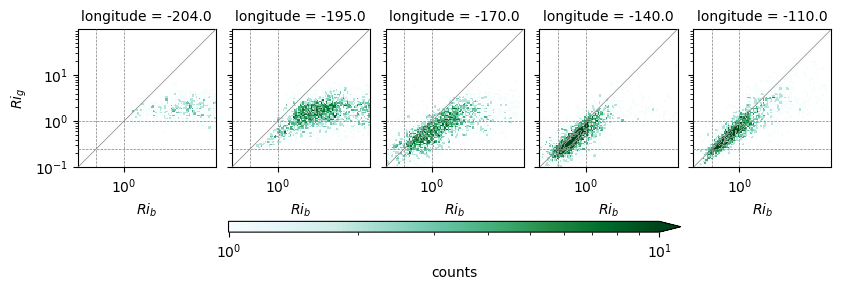

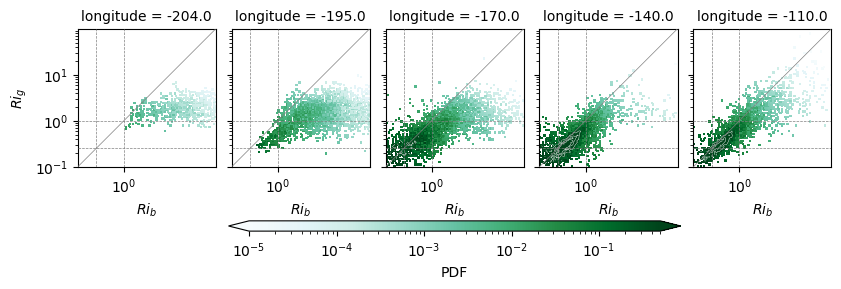

In [ ]:
reduced_Ri = (Ri.drop("season")
    .map(lambda x: x.clip(min=0, max=100))
    .resample(time="D")
    .median())

plot_Ri_histograms(
    wrap_hist(reduced_Ri, density=False), norm=mpl.colors.LogNorm(vmin=1, vmax=10),
)
plot_Ri_histograms(
    wrap_hist(reduced_Ri, density=True), norm=mpl.colors.LogNorm(vmin=1e-5, vmax=0.5),
)

### seasonal Rib vs Rig

In [ ]:
Ri_seasonal_hist = (
    Ri.groupby("season").apply(wrap_hist).reindex(season=["DJF", "MAM", "JJA", "SON"])
)
Ri_seasonal_hist

<xarray.DataArray 'histogram_bulk_gradient' (season: 4, longitude: 5, bulk_bin: 49, gradient_bin: 49)>
array([[[[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  2, ...,  0,  0,  0]],

        [[ 1,  3,  3, ...,  0,  0,  0],
         [12,  1,  3, ...,  0,  0,  0],
         [ 4,  4,  2, ...,  0,  0,  0],
         ...,
         [ 0,  1,  0, ...,  1,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 3,  6,  8, ...,  0,  0,  0],
         [ 7,  9,  9, ...,  0,  0,  0],
         [12, 20, 13, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  1, ...,  1,  0,  0]],

        [[ 2,  8,  2, ...,  0,  0,  0],
         [ 7,  4,  3, ...,  0,  0,  0],
         [ 6,  2,  4, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  1,  1,  0],
         [ 0,  0,  0, ...,  1,  1,  0],
         [ 0,  0,  0, ...,  2,  0,  1]]],


       [[[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  1,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 1,  0,  3, ...,  0,  0,  0],
         [ 0,  1,  2, ...,  0,  0,  0],
         [ 2,  1,  1, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  2,  1,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  1,  0]],

        [[ 0,  5,  5, ...,  0,  0,  0],
         [ 2,  4,  8, ...,  0,  0,  0],
         [ 3,  4,  3, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  1,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 2,  2,  7, ...,  0,  1,  0],
         [ 3,  6,  6, ...,  0,  0,  0],
         [ 3,  2, 11, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  1,  2,  1],
         [ 0,  0,  0, ...,  2,  1,  3],
         [ 0,  0,  0, ...,  4,  2,  1]]],


       [[[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  1],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  1,  0,  0],
         [ 0,  0,  0, ...,  0,  1,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 1,  2,  4, ...,  0,  0,  0],
         [ 2,  3,  2, ...,  0,  0,  0],
         [ 5,  1,  5, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  1,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  1],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 2,  5,  5, ...,  0,  0,  0],
         [ 2,  7,  5, ...,  0,  0,  0],
         [ 4,  2, 10, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 4,  5,  5, ...,  0,  0,  0],
         [ 4,  5,  5, ...,  0,  0,  0],
         [ 3,  7,  4, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  1],
         [ 0,  0,  0, ...,  0,  0,  1]]],


       [[[ 0,  0,  0, ...,  0,  0,  0],
         [ 

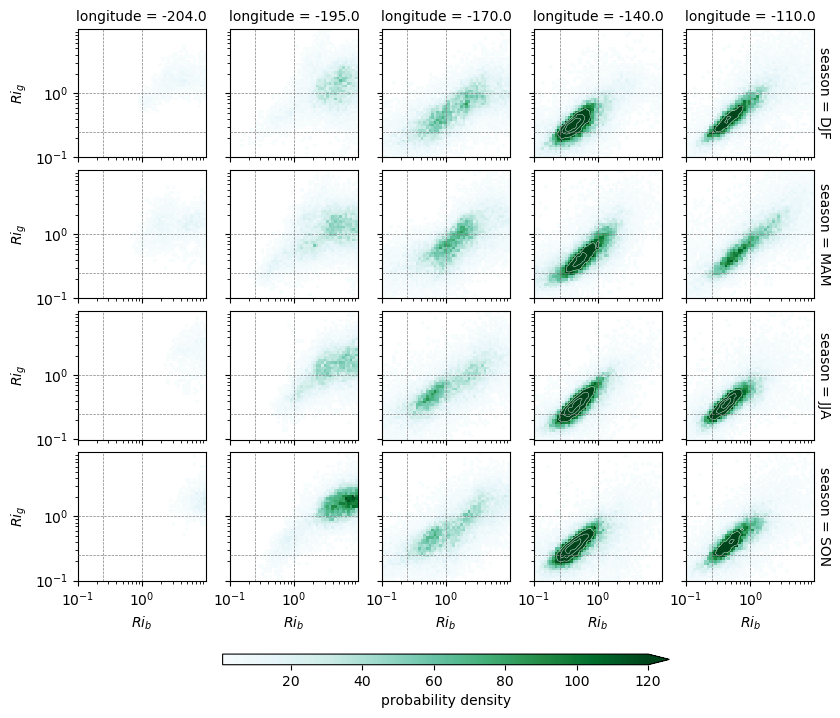

In [ ]:
fg = Ri_seasonal_hist.where(Ri_hist > 0).plot(
    row="season",
    col="longitude",
    x="bulk_bin",
    y="gradient_bin",
    robust=True,
    xscale="log",
    yscale="log",
    cmap=mpl.cm.BuGn,
    cbar_kwargs={
        "orientation": "horizontal",
        "label": "probability density",
        "aspect": 40,
        "shrink": 0.6,
        "pad": 0.1,
    },
)


def mark_lines():
    dcpy.plots.linex([0.25, 1], ax=plt.gca(), zorder=10, lw=0.5)
    dcpy.plots.liney([0.25, 1], ax=plt.gca(), zorder=10, lw=0.5)
    plt.gca().set_aspect(1)


fg.set_xlabels("$Ri_b$")
fg.set_ylabels("$Ri_g$")
fg.fig.set_size_inches((8, 8))
fg.map(mark_lines)

fg.map_dataarray(
    xr.plot.contour,
    x="bulk_bin",
    y="gradient_bin",
    colors="w",
    levels=np.linspace(*np.nanpercentile(Ri_hist, [99.1, 99.9]), 3),
    linewidths=0.3,
    add_colorbar=False,
)

fg.fig.savefig("images/gradient-bulk-ri-joint-pdf.png", dpi=200, bbox_inches="tight")

(0.1, 100)

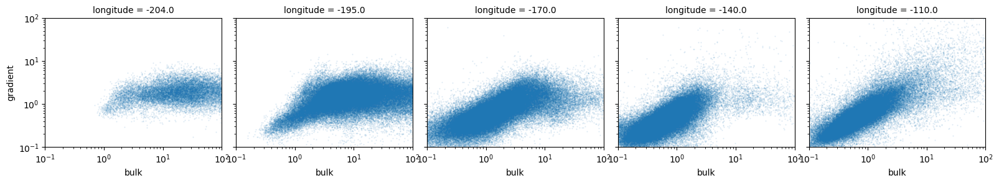

In [ ]:
mask = (
    Ri.bulk.notnull()
    & Ri.gradient.notnull()
    & (Ri.gradient < 100)
    & (Ri.bulk < 100)
    & (Ri.bulk > 0)
    & (Ri.gradient > 0)
)
masked = Ri.where(mask, drop=True)
masked["season"] = masked.time.dt.season
fg = masked.plot.scatter(
    col="longitude", x="bulk", y="gradient", s=0.5, alpha=0.1,
)
plt.gca().set_xscale("log")
plt.gca().set_yscale("log")
plt.gca().set_xlim([0.1, 100])
plt.gca().set_ylim([0.1, 100])

# fg.fig.savefig("images/bulk-vs-gradient-ri.png", dpi=180)

## Datasets

### johnson

In [ ]:
johnson = pump.obs.read_johnson().sel(latitude=0)
johnson["eucmax"] = pump.get_euc_max(johnson.u)
johnson = pump.calc.estimate_euc_depth_terms(johnson)
johnson.attrs["name"] = "Johnson"
johnson.load()

<xarray.Dataset>
Dimensions:    (depth: 50, lon_edges: 11, longitude: 10)
Coordinates:
  * longitude  (longitude) float64 -217.0 -204.0 -195.0 ... -125.0 -110.0 -95.0
  * lon_edges  (lon_edges) float64 136.5 149.5 160.5 172.5 ... 242.5 257.5 272.5
    latitude   float64 0.0
  * depth      (depth) float64 -5.0 -15.0 -25.0 -35.0 ... -475.0 -485.0 -495.0
Data variables:
    temp       (depth, longitude) float32 29.32408 29.32196 ... 8.023529
    salt       (depth, longitude) float32 34.19115 34.45227 ... 34.63364
    dens       (depth, longitude) float32 1021.3508 1021.5474 ... 1026.9829
    u          (depth, longitude) float32 0.08695984 0.1127472 ... nan nan
    TSPTS      (depth, longitude) float32 20.0 34.0 28.0 46.0 ... 47.0 38.0 24.0
    UPTS       (depth, longitude) float32 20.0 34.0 27.0 ... nan 2.362488 nan
    eucmax     (longitude) float64 -215.0 -185.0 -185.0 ... -85.0 -75.0 -65.0
    h          (longitude) float64 -190.0 -160.0 -160.0 ... -60.0 -50.0 -40.0
    us         (longitude) float32 0.04620361 0.1165466 ... 0.2585754 0.2067261
    ueuc       (longitude) float32 0.4239502 0.4944916 ... 0.9161682 0.7123413
    du         (longitude) float32 -0.37774658 -0.377945 ... -0.50561523
    dens_euc   (longitude) float64 1.026e+03 1.025e+03 ... 1.026e+03 1.026e+03
    b          (depth, longitude) float64 -9.766 -9.774 -9.776 ... -9.822 -9.822
    bs         (longitude) float64 -9.767 -9.775 -9.776 ... -9.794 -9.793 -9.795
    beuc       (longitude) float64 -9.81 -9.81 -9.81 -9.81 ... -9.81 -9.81 -9.81
    db         (longitude) float64 0.04333 0.03527 0.03391 ... 0.01668 0.01474
    Rib        (longitude) float64 57.7 39.51 37.72 10.22 ... 1.185 1.929 2.307
Attributes:
    history:  FERRET V5.41    1-Oct-02
    name:     Johnson

### TAO daily → full average

In [ ]:
# need to fill to the surface
tao_adcp = pump.obs.read_tao_adcp().mean("time").bfill("depth")
tao_adcp["eucmax"] = pump.get_euc_max(tao_adcp.u)

tao_ctd_raw = (
    pump.obs.read_tao()
    .sel(latitude=0, longitude=tao_adcp.longitude)
    .sortby("depth")
    .chunk({"depth": -1})
    .pipe(dcpy.interpolate.pchip_fillna, dim="depth")
    .drop(["u", "v"])
    .mean("time")
    .compute()
)
tao_ctd = tao_ctd.ffill("depth")
tao_ctd["dens"] = pump.mdjwf.dens(np.array(35.0), tao_ctd.temp, tao_ctd.depth)
tao_ctd["eucmax"] = tao_adcp.eucmax

tao_daily = xr.merge(
    [
        pump.calc.estimate_euc_depth_terms(tao_adcp)[
            ["h", "us", "ueuc", "du", "eucmax"]
        ],
        pump.calc.estimate_euc_depth_terms(tao_ctd)[["bs", "beuc", "db"]],
    ]
)
tao_daily = pump.calc.estimate_Rib(tao_daily)
tao_daily.attrs["name"] = "TAO"
tao_daily.load()

/glade/u/home/dcherian/pump/pump/obs.py:190: FutureWarning: In xarray version 0.15 the default behaviour of `open_mfdataset`
will change. To retain the existing behavior, pass
combine='nested'. To use future default behavior, pass
combine='by_coords'. See
http://xarray.pydata.org/en/stable/combining.html#combining-multi

  chunks={"lat": 1, "lon": 1, "depth": 5},
/gpfs/u/home/dcherian/python/xarray/xarray/backends/api.py:933: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset`) to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in future, please use the new
`combine_nested` function (or the `combine='nested'` option to
open_mfdataset).The datasets supplied require both concatenation and merging. From
xarray version 0.15 this will operation will require either using the
new `co

<xarray.Dataset>
Dimensions:    (longitude: 6)
Coordinates:
  * longitude  (longitude) float64 -213.0 -204.0 -195.0 -170.0 -140.0 -110.0
    latitude   float64 0.0
Data variables:
    h          (longitude) float32 -200.0 -175.0 -170.0 -130.0 -80.0 -50.0
    us         (longitude) float32 -0.06934669 0.093757585 ... 0.19134645
    ueuc       (longitude) float32 0.33551154 0.4491259 ... 1.0492624 0.9650307
    du         (longitude) float32 -0.40485823 -0.35536832 ... -0.77368426
    eucmax     (longitude) float32 -225.0 -200.0 -195.0 -155.0 -105.0 -75.0
    bs         (longitude) float64 -9.782 -9.783 -9.784 -9.794 -9.8 -9.801
    beuc       (longitude) float64 -9.81 -9.81 -9.81 -9.81 -9.81 -9.81
    db         (longitude) float64 0.02783 0.02671 0.02559 ... 0.01005 0.009183
    Rib        (longitude) float64 33.96 37.01 18.15 3.023 0.6735 0.767
Attributes:
    name:     TAO

### TAO hourly → average

In [ ]:
tao_clim = tao.mean("time")
tao_clim["eucmax"] = pump.calc.get_euc_max(tao_clim.u)
tao_clim = pump.calc.estimate_euc_depth_terms(tao_clim)
tao_clim.attrs["name"] = "TAO"
tao_clim.load()

NameError: name 'tao' is not defined

In [ ]:
seasonal = tao_zeuc.reset_coords().groupby("time.season")
seasonal_mean = (
    seasonal.mean()
    .where(seasonal.count() > 90 * 24)
    .reindex(season=["DJF", "MAM", "JJA", "SON"])
)
seasonal_mean.load()

<xarray.Dataset>
Dimensions:    (longitude: 5, season: 4, zeuc: 59)
Coordinates:
  * season     (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (season, longitude, zeuc) float64 8.232 11.67 9.22 ... nan nan
    T          (season, longitude, zeuc) float64 13.6 13.82 14.05 ... nan nan
    deepest    (season, longitude) float64 -488.7 -470.1 ... -382.0 -440.7
    dens       (season, longitude, zeuc) float64 1.025e+03 1.025e+03 ... nan nan
    eucmax     (season, longitude) float64 3.264 4.126 9.016 ... 2.976 6.241
    latitude   (season) float32 nan nan nan nan
    mld        (season, longitude) float64 -34.32 -34.82 ... -16.38 -11.45
    u          (season, longitude, zeuc) float64 0.3643 0.389 0.4046 ... nan nan
    v          (season, longitude, zeuc) float64 -0.009484 -0.007725 ... nan nan

In [ ]:
seasonal_mean["Rig_mean"] = seasonal_mean.Rig
seasonal_mean["depth"] = seasonal_mean.eucmax + seasonal_mean.zeuc
seasonal_mean = seasonal_mean.set_coords(["eucmax", "depth"])
seasonal_mean["Rig"] = pump.calc.calc_tao_ri(seasonal_mean[["u", "v"]], seasonal_mean["T"], dim="zeuc")

/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)
/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)
/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)


In [ ]:
seasonal_mean["Rig_median"] = (
    tao_zeuc.Rig.chunk({"time": -1})
    .groupby("time.season")
    .quantile(dim="time", q=0.5)
    .compute()
)

/gpfs/u/home/dcherian/python/xarray/xarray/core/common.py:664: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  self, group, squeeze=squeeze, restore_coord_dims=restore_coord_dims


In [ ]:
seasonal_mean["N2"] = -9.81 / 1025 * seasonal_mean.dens.differentiate("zeuc")
seasonal_mean["S2"] = (
    seasonal_mean.u.differentiate("zeuc") ** 2
    + seasonal_mean.u.differentiate("zeuc") ** 2
)

/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:107: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  xplt = darray.transpose(ydim, huedim)


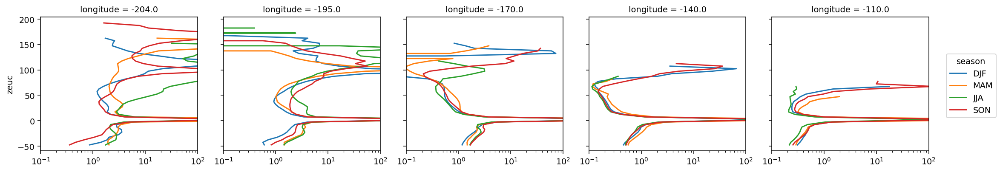

In [ ]:
(seasonal_mean.N2 / seasonal_mean.S2).plot(
    col="longitude", hue="season", y="zeuc", xlim=[0.1, 100], xscale="log"
)

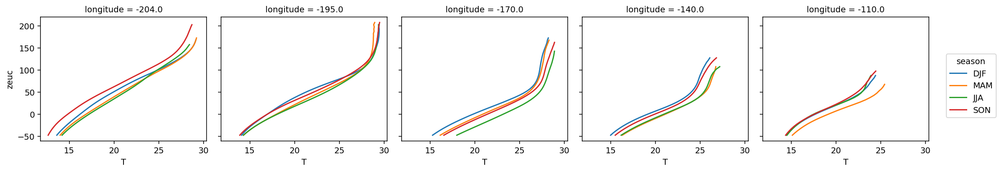

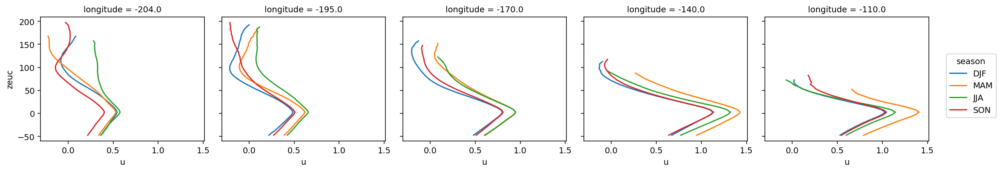

In [ ]:
(seasonal_mean.T).plot(col="longitude", hue="season", y="zeuc")
(seasonal_mean.u).plot(col="longitude", hue="season", y="zeuc")

$N²$ isn't changing that much moving eastward consistent with the bulk $Δb$. Shear $S²$ is changing significantly, again consistent

/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:107: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  xplt = darray.transpose(ydim, huedim)


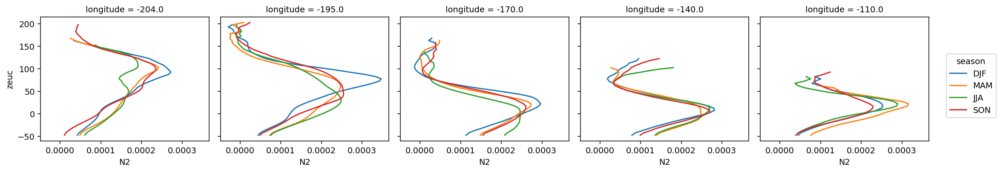

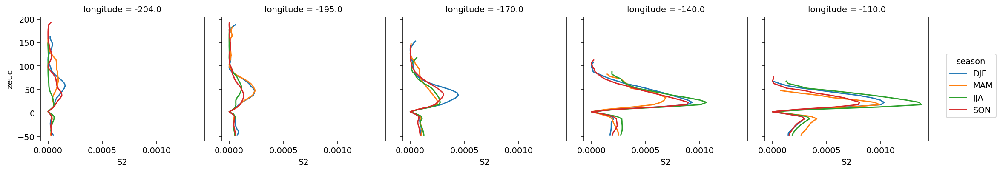

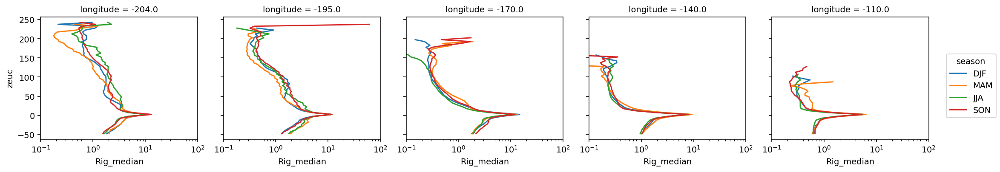

In [ ]:
(seasonal_mean.N2).plot(col="longitude", hue="season", y="zeuc")
(seasonal_mean.S2).plot(col="longitude", hue="season", y="zeuc")
(seasonal_mean.Rig_median).plot(col="longitude", hue="season", y="zeuc", xlim=[0.1, 100], xscale="log")

In [ ]:
counts = tao_zeuc.count("time").load()

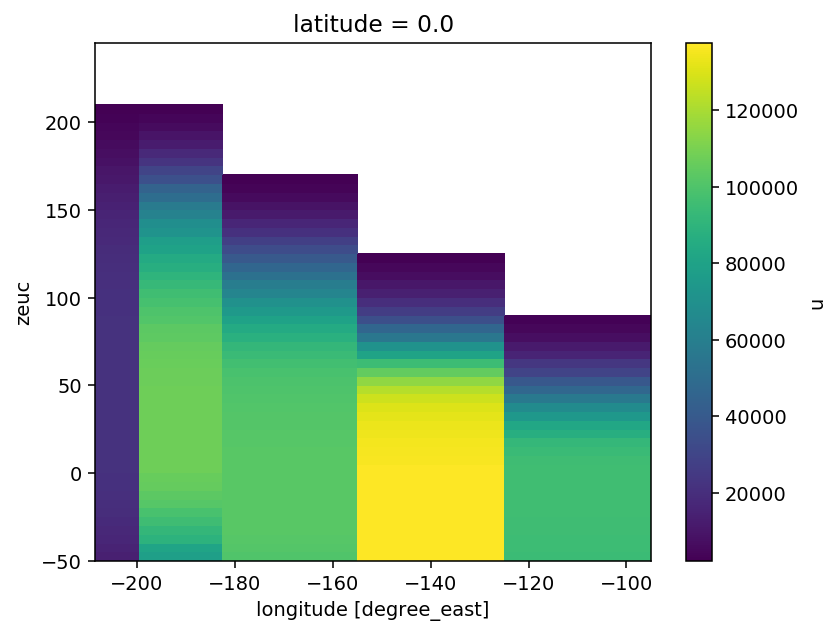

In [ ]:
counts.u.where(counts.u > 90*24).plot(x="longitude")

In [ ]:
annual_mean = tao_zeuc.groupby("time.year").mean().mean("year").load().where(counts > 90*24)

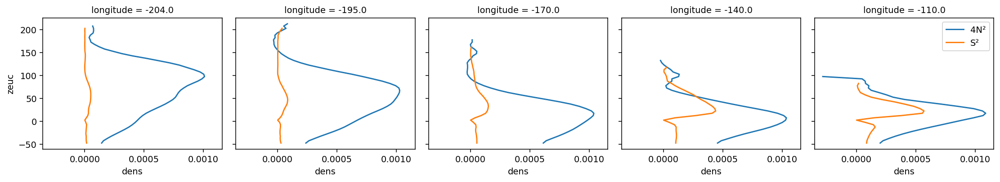

In [ ]:
fg = (4*-9.81/1025 * annual_mean.dens.differentiate("zeuc")).plot(col="longitude", y="zeuc")
S2 = annual_mean.u.differentiate("zeuc")**2 + annual_mean.v.differentiate("zeuc")**2
for loc, ax in zip(fg.name_dicts.flat, fg.axes.flat):
    ax.plot(S2.sel(loc), S2.zeuc)
    # ax.set_xscale("log")
    
ax.legend(["4N²", "S²"])

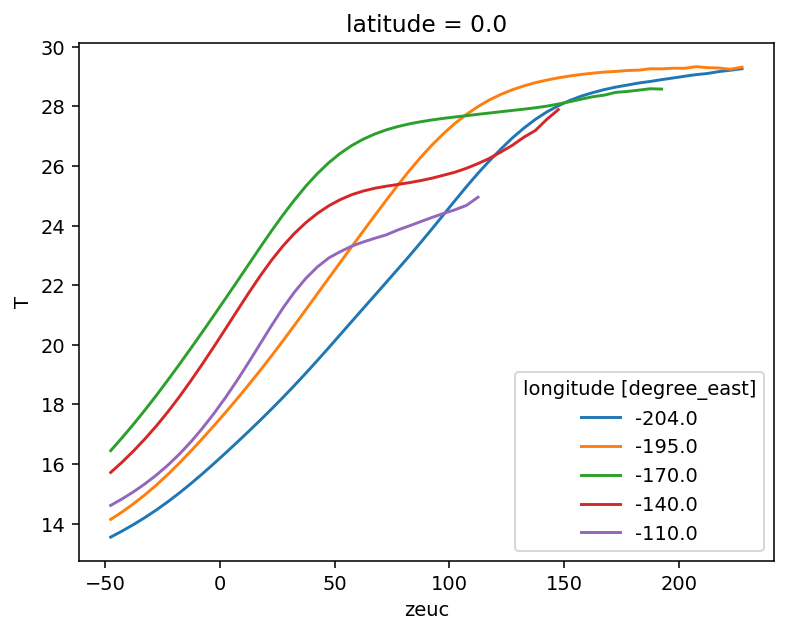

In [ ]:
counts = tao_zeuc.count("time")
tao_zeuc = tao_zeuc.where(counts > 30*24)

In [ ]:
zeuc_clim = pump.calc.calc_tao_ri(dim="zeuc")

<xarray.Dataset>
Dimensions:    (longitude: 5, zeuc: 59)
Coordinates:
    latitude   float32 ...
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>
    T          (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>
    dens       (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>
    u          (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>
    v          (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>

## Figure 5

In [ ]:
tao_zeuc = xr.open_zarr("tao-zeuc.zarr")
tao_zeuc

<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267, zeuc: 59)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    eucmax     (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    T          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    dens       (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    u          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    v          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>

In [ ]:
ri = tao_zeuc.Rig.compute().median("time")

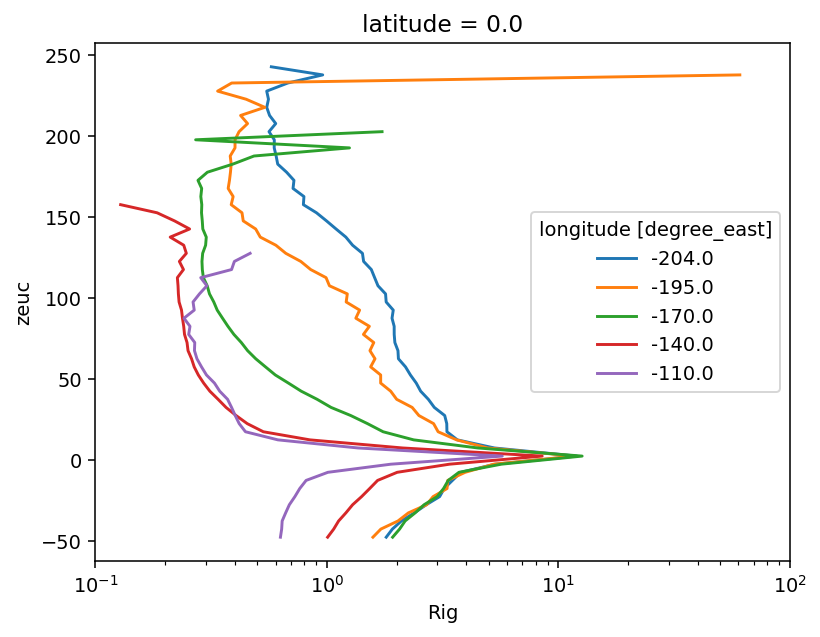

In [ ]:
ri.plot(hue="longitude", y="zeuc", xscale="log", xlim=(0.1,100))

In [ ]:
tao_zeuc = tao_zeuc.where(tao_zeuc.count("time") > 90 * 24)
Ri_q_annual = (
    tao_zeuc.Rig.sel(zeuc=slice(0, None))
    .chunk({"time": -1, "zeuc": -1})
    .quantile(q=[0.25, 0.5, 0.75], dim=["time", "zeuc"])
)
Ri_q_annual.load()

<xarray.DataArray 'Rig' (quantile: 3, longitude: 5)>
array([[0.81522617, 0.58695033, 0.26694281, 0.22278418, 0.26821389],
       [1.97553892, 1.58871084, 0.70549343, 0.41711624, 0.54069482],
       [5.45856488, 4.62699244, 2.61483129, 1.18364173, 1.5925003 ]])
Coordinates:
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * quantile   (quantile) float64 0.25 0.5 0.75

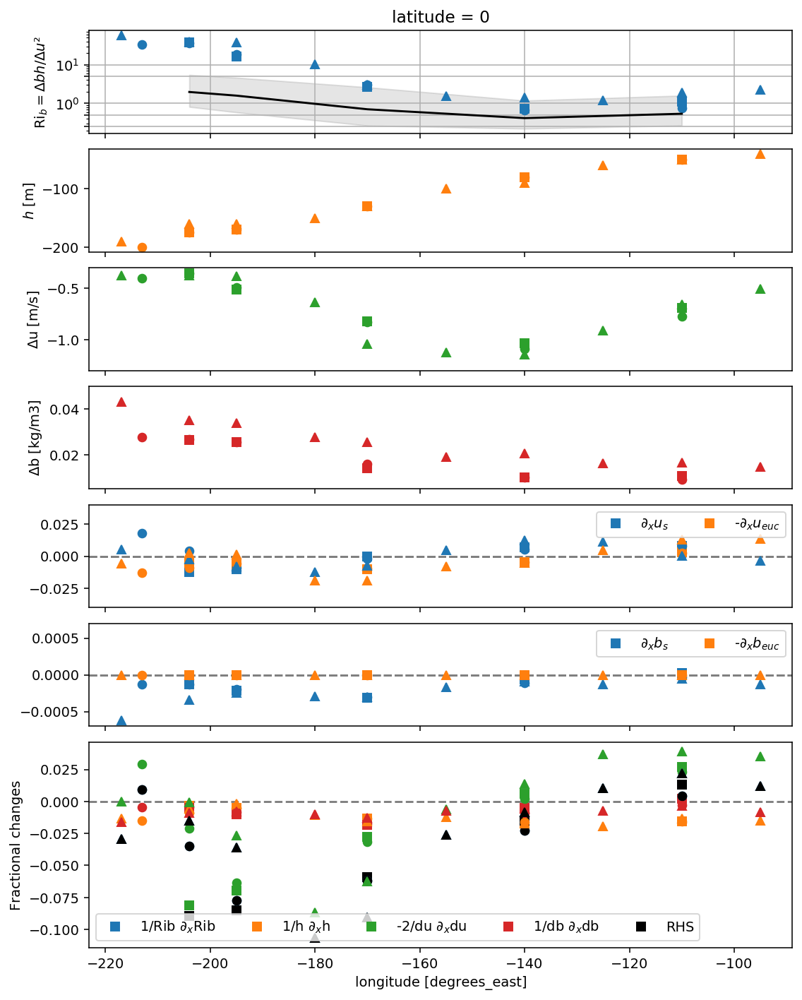

In [ ]:
f, ax = pump.plot.plot_bulk_Ri_diagnosis(tao_clim, ls="none", marker= 's')
pump.plot.plot_bulk_Ri_diagnosis(tao_daily, ls="none", marker= 'o', f=f, ax=ax)
pump.plot.plot_bulk_Ri_diagnosis(johnson, ls="none", marker= '^', f=f, ax=ax)
# ri.sel(zeuc=slice(0,None)).mean("zeuc").plot(ax=ax["Rib"], color='k')

dccpy.plots.fill_between(
    Ri_q_annual.sel(quantile=[0.25, 0.75]),
    axis="y",
    y="quantile",
    x="longitude",
    alpha=0.1,
    ax=ax["Rib"],
    color='k'
)
Ri_q_annual.sel(quantile=0.5).plot(color='k', ax=ax["Rib"], _labels=False)
# pump.plot.plot_bulk_Ri_diagnosis(johnson, ls="none", marker= '^', f=f, ax=ax)

In [ ]:
cluster.scale(1)

In [ ]:
tao = pump.obs.read_tao_zarr("ancillary")
tao

<xarray.Dataset>
Dimensions:    (depth: 101, longitude: 5, time: 292267)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * depth      (depth) float64 -500.0 -495.0 -490.0 -485.0 ... -10.0 -5.0 0.0
    eucmax     (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    zeuc       (depth, time, longitude) float64 dask.array<chunksize=(101, 10000, 1), meta=np.ndarray>
Data variables:
    Rig        (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    T          (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    dens       (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    u          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>
    v          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>

In [ ]:
tao_bulked = pump.calc.estimate_euc_depth_terms(tao)
tao

/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:393: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*arr.dims)


,Array,Chunk
Bytes,1.18 GB,8.08 MB
Shape,"(292267, 5, 101)","(10000, 1, 101)"
Count,151 Tasks,150 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,1.18 GB,8.08 MB
Shape,"(292267, 5, 101)","(10000, 1, 101)"
Count,151 Tasks,150 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


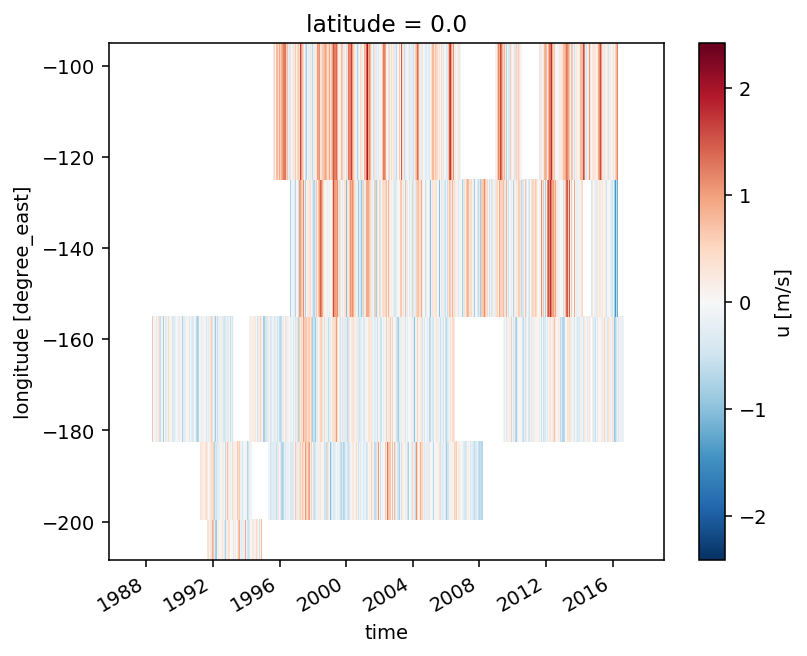

In [ ]:
tao.us.plot(x="time")

In [ ]:
tao_zeuc = xr.open_zarr("tao-zeuc.zarr")
tao_zeuc

<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267, zeuc: 59)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    eucmax     (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    T          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    dens       (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    u          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    v          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>

In [ ]:
tao_zeuc

# Merge TAO ADCP with current meters

In [ ]:
tao_ctd = pump.obs.read_tao()
tao_adcp = pump.obs.read_tao_adcp()

/glade/u/home/dcherian/pump/pump/obs.py:170: FutureWarning: In xarray version 0.15 the default behaviour of `open_mfdataset`
will change. To retain the existing behavior, pass
combine='nested'. To use future default behavior, pass
combine='by_coords'. See
http://xarray.pydata.org/en/stable/combining.html#combining-multi

  chunks={"lat": 1, "lon": 1, "depth": 5},
/gpfs/u/home/dcherian/python/xarray/xarray/backends/api.py:933: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset`) to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in future, please use the new
`combine_nested` function (or the `combine='nested'` option to
open_mfdataset).The datasets supplied require both concatenation and merging. From
xarray version 0.15 this will operation will require either using the
new `co

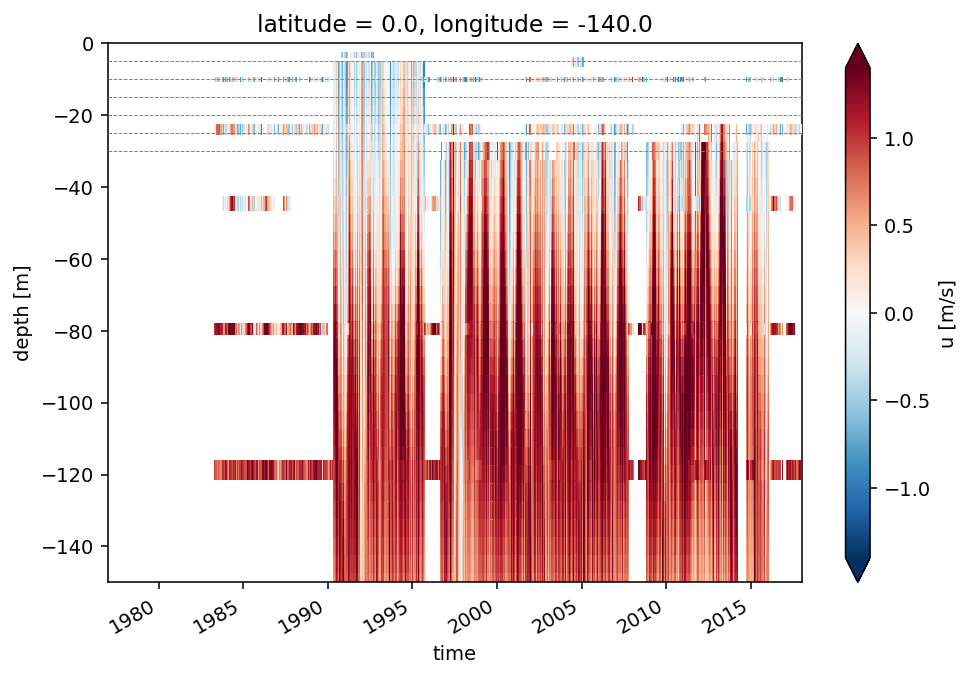

In [ ]:
%matplotlib inline

lon = -140

tao_adcp.u.sel(longitude=lon).plot(
    y="depth", robust=True, vmin=-1.4, vmax=1.4, add_colorbar=False, cmap=mpl.cm.RdBu_r)
tao_ctd.u.sel(longitude=lon, latitude=0).plot(
    y="depth", robust=True, zorder=10, ylim=(-150, 0), vmin=-1.4, vmax=1.4, cmap=mpl.cm.RdBu_r)
dcpy.plots.liney([-5, -10, -15, -20, -25, -30], zorder=10, lw=0.5)
plt.gcf().set_size_inches((8, 5))

In [ ]:
hrcur = pump.obs.read_eq_tao_cur_hr()

100%|██████████| 5/5 [00:00<00:00,  5.80it/s]


In [ ]:
hrcur.reindex(time=tao.time).u.sel(longitude=-140, depth=-10).plot(lw=1)
tao.u.sel(longitude=-140, depth=-25).plot(lw=1)

In [ ]:
hrcur = pump.obs.read_eq_tao_cur_hr()

depth = [-25, -10]
region = dict(depth=depth)
cur = hrcur.reindex(time=tao.time).sel(**region)
adcp = tao.sel(**region)

merged = xr.concat([tao[["u", "v"]].sel(depth=slice(None, -26)),
                    xr.merge([cur.where(adcp.isnull()), adcp], compat="no_conflicts")],
                   dim="depth").reindex(depth=tao.depth)
# tao = tao.update(merged, inplace=False)

100%|██████████| 5/5 [00:00<00:00,  5.58it/s]


In [ ]:
tao_merged = tao.copy().update(merged)
tao_merged

,Array,Chunk
Bytes,789.12 MB,5.40 MB
Shape,"(292267, 135, 5)","(10000, 135, 1)"
Count,451 Tasks,150 Chunks
Type,float32,numpy.ndarray
,Array,Chunk
Bytes,789.12 MB,4.92 MB
Shape,"(292267, 135, 5)","(10000, 123, 1)"
Count,2840 Tasks,300 Chunks
Type,float32,numpy.ndarray
,Array,Chunk


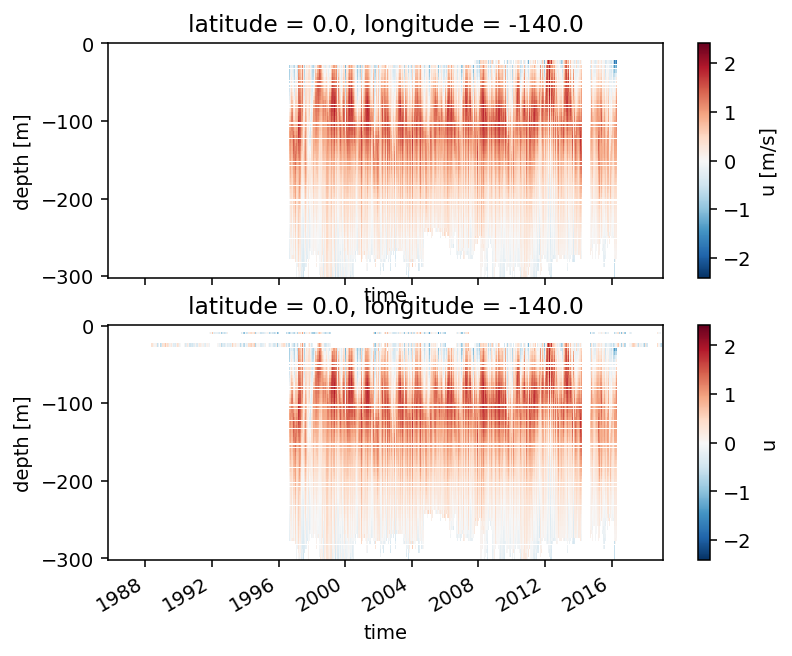

In [ ]:
f, ax = plt.subplots(2, 1, sharex=True)
tao.u.sel(longitude=-140, depth=slice(-300, None)).plot(ax=ax[0], x="time")
tao_merged.u.sel(longitude=-140, depth=slice(-300, None)).plot(ax=ax[1], x="time")

## check out hi res current meters

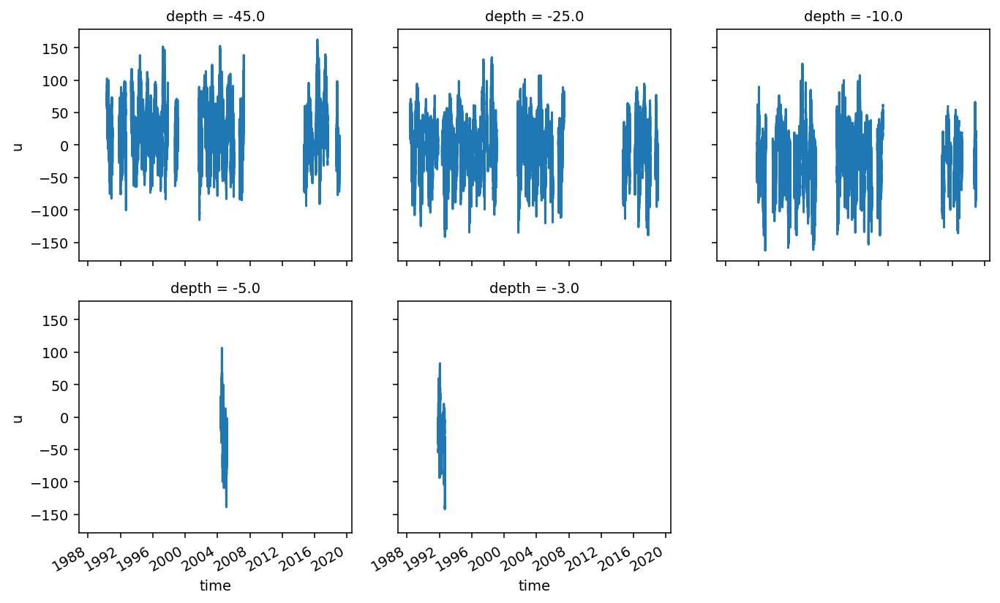

In [ ]:
(
    hrcur.sel(depth=slice(-50, None), longitude=-140)
    .u.dropna("depth", how="all")
    .plot(col="depth", col_wrap=3)
)

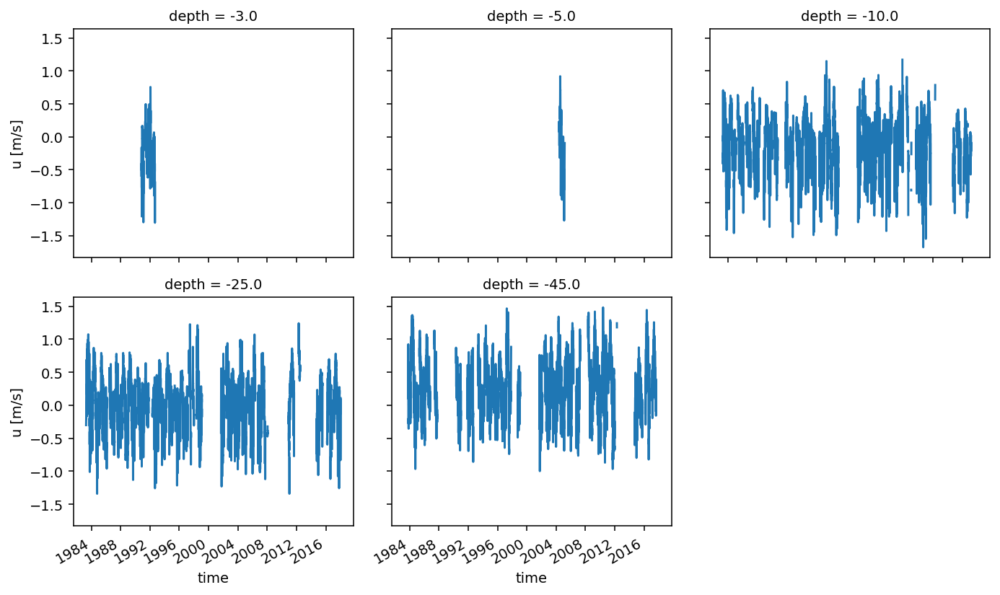

In [ ]:
(
    tao_ctd.sel(depth=slice(None, -50), longitude=-140, latitude=0)
    .u.dropna("depth", how="all")
    .plot(col="depth", col_wrap=3)
)

## merging daily data : boo!

In [ ]:
tao_adcp.depth

<xarray.DataArray 'depth' (depth: 95)>
array([  -0.,  -10.,  -15.,  -20.,  -25.,  -30.,  -35.,  -40.,  -45.,  -50.,
        -55.,  -60.,  -65.,  -70.,  -75.,  -80.,  -85.,  -90.,  -95., -100.,
       -105., -110., -115., -120., -125., -130., -135., -140., -145., -150.,
       -155., -160., -165., -170., -175., -180., -185., -190., -195., -200.,
       -205., -210., -215., -220., -225., -230., -235., -240., -245., -250.,
       -255., -260., -265., -270., -275., -280., -285., -290., -295., -300.,
       -305., -310., -315., -320., -325., -330., -335., -340., -345., -350.,
       -355., -360., -365., -370., -375., -380., -385., -390., -395., -400.,
       -405., -410., -415., -420., -425., -430., -435., -440., -445., -450.,
       -455., -460., -465., -470., -475.], dtype=float32)
Coordinates:
    latitude  float32 0.0
  * depth     (depth) float32 -0.0 -10.0 -15.0 -20.0 ... -465.0 -470.0 -475.0
Attributes:
    FORTRAN_format:  
    units:           m
    type:            UNEVEN
    epic_code:       3
    positive:        down
    standard_name:   depth

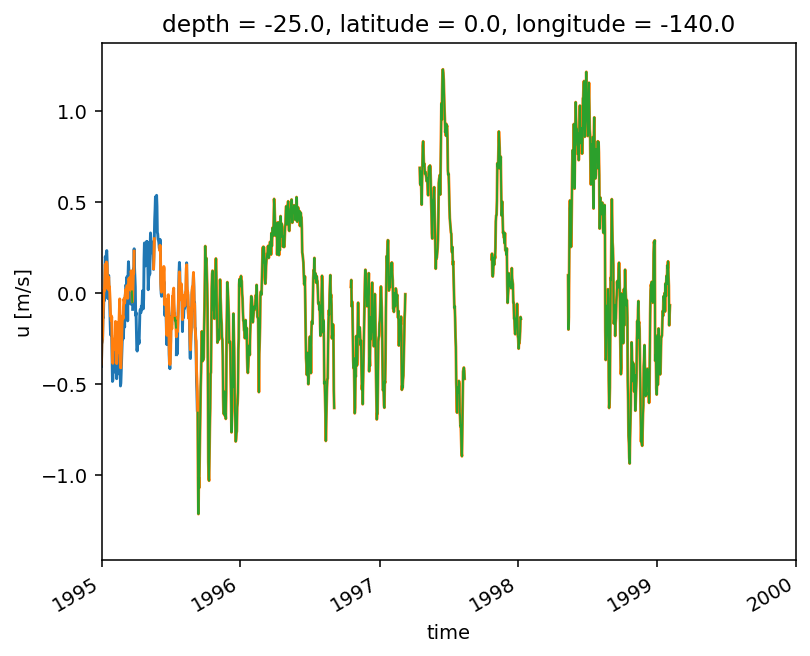

In [ ]:
tao_adcp.u.sel(longitude=-140, depth=-25).plot()
tao_ctd.u.sel(longitude=-140, latitude=0, depth=-25).plot(xlim=("1995", "2000"))

(tao_ctd.u.sel(latitude=0, longitude=-140, depth=-25)
.reindex(time=tao_adcp.time)  # time is at noon on each day
.where(tao_adcp.u.sel(longitude=-140,depth=-25).isnull())
.plot(lw=1))

In [ ]:
xr.merge([tao_adcp.u.sel(longitude=-140), 
          tao_ctd.u.sel(longitude=-140, latitude=0, depth=-25)
          .where(tao_adcp.u.)],
         compat="no_conflicts")

MergeError: conflicting values for variable 'u' on objects to be combined. You can skip this check by specifying compat='override'.

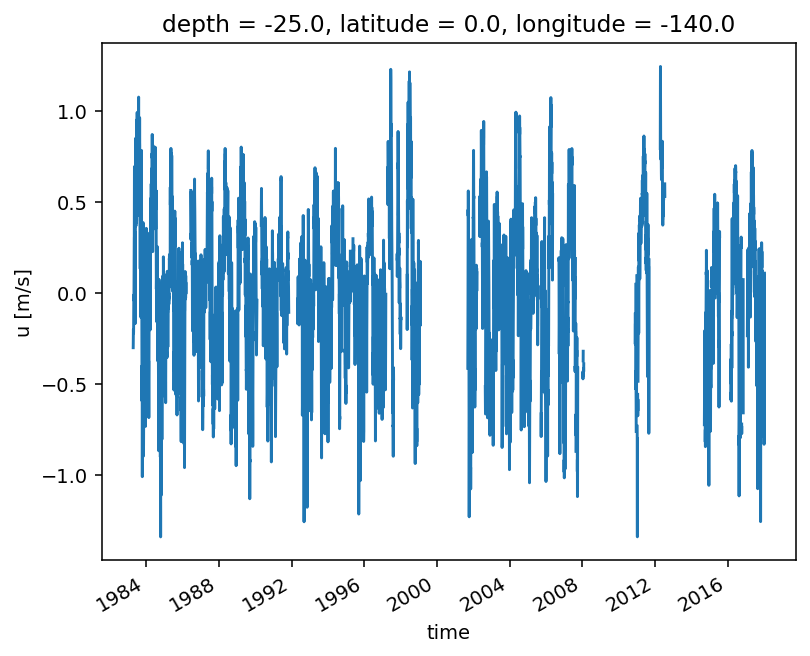

In [ ]:
tao_ctd.u.sel(depth=-25, longitude=-140, latitude=0).plot()

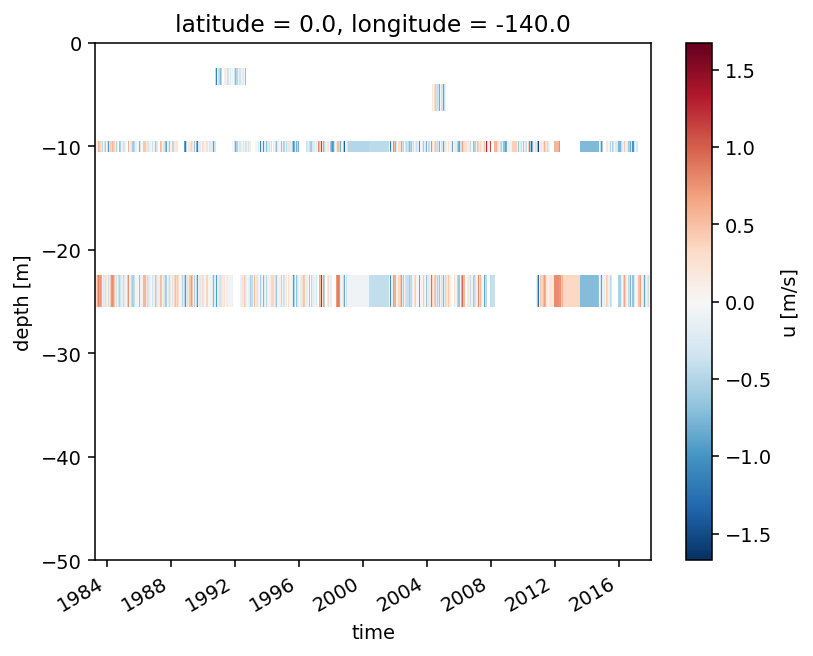

In [ ]:
(tao_ctd.u.sel(longitude=-140, latitude=0)
 .sel(depth=slice(-32))
 .dropna("time", how="all")
 .plot(ylim=[-50, 0]))

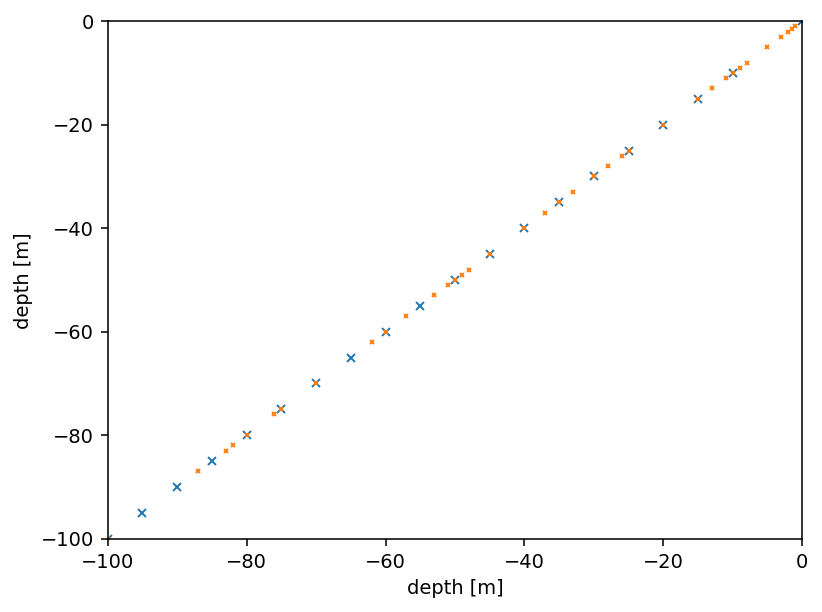

In [ ]:
%matplotlib inline

tao_adcp.depth.plot(y="depth", marker='x', ms=4, ls='None')
tao_ctd.u.depth.plot(y="depth", marker='x', ms=2, ls='None', xlim=[-100, 0], ylim=[-100, 0])

In [ ]:
tao_ctd.u.reindex(depth=tao_adcp.depth)

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/dask/array/core.py:3864: PerformanceWarning: Increasing number of chunks by factor of 15
  **blockwise_kwargs


,Array,Chunk
Bytes,1.65 GB,4.32 MB
Shape,"(17, 17, 95, 14983)","(2, 1, 36, 14983)"
Count,17207 Tasks,1275 Chunks
Type,float32,numpy.ndarray


# Next steps

1. [x] Make a merged velocity dataset
2. [ ] Add 147E to merged dataset
2. Try the Pham extrapolation
3. [x] Do something about eucmax in El-Nino years
4. [x] eucmax = 25 before 1996?
5. [x] eucmax at 156E, 165E
6. 165E doesn't really have much data at all
7. [x] deal with euc shoaling
8. Where is the high-res Ucur, Vcur for 2012-ish? It's present in the daily data
9. [x] I need to interpolate the density field to get a good dens_euc

I will need to
1. Recalculate bulk Ri stuff. This really shouldn't change much?
2. Scatter median gradient Ri against the new bulk Ri
3. What the heck is going on at 195W. Marginal stability?

